<a href="https://colab.research.google.com/github/Afique1/Business-Review-by-user/blob/Afique's-work/merging_works_SIT742Task2_Group32.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Questions selection
Questions are selected based on the birthdate(day) of students [if it's even/odd then selected Q. are even/odd]

In [1]:
students = {"Afique": 11,"Alan": 10}
questions = list(range(1, 9))  # 8 questions for Part 1

assignments = {}

for student, birthdate in students.items():
  assignments[student] = []
  for question in questions:
    if (birthdate % 2 == 0 and question % 2 == 0) or (birthdate % 2 != 0 and question % 2 != 0):
      assignments[student].append(f"Q{question}")

print("Assigned Questions for part 1:\n"+"-"*40)

for student, assigned_questions in assignments.items():
  print(f"{student} (Birthdate: {students[student]}): {', '.join(assigned_questions)}")

Assigned Questions for part 1:
----------------------------------------
Afique (Birthdate: 11): Q1, Q3, Q5, Q7
Alan (Birthdate: 10): Q2, Q4, Q6, Q8


# Part 0) Read the data using Pyspark

Update and Import packages

In [2]:
#update local version of the package catalogue
!apt-get update
# install Java8
!apt-get install openjdk-8-jdk-headless -qq > /dev/null

# install findspark
!pip install -q findspark

import findspark
findspark.init()

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:6 https://cli.github.com/packages stable InRelease [3,917 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:8 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [3,336 kB]
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,274 kB

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# from pyspark import SparkContext
# from pyspark.sql import SQLContext

`SparkSession` is the combination of SparkContext and SQLContext. So, the updated package/ will be used.


In [4]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .master("local[*]") \
    .appName("BusinessReviewAnalysis") \
    .getOrCreate()

print("Spark session created successfully!")

Spark session created successfully!


Download and save the csv file locally.

In [5]:
!pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=6efbcc35e7b14c5949886f73fc7dcfdb8b8c8058734253530a107c8facbaa5c7
  Stored in directory: /root/.cache/pip/wheels/01/46/3b/e29ffbe4ebe614ff224bad40fc6a5773a67a163251585a13a9
Successfully built wget


In [6]:
import wget

link_to_data1 = 'https://github.com/Afique1/Business-Review-by-user/raw/main/Dataset/meta-review-business.csv'
link_to_data2 = 'https://github.com/Afique1/Business-Review-by-user/raw/main/Dataset/review.csv'

MetaReview_Dataset = wget.download(link_to_data1)
Review_Dataset = wget.download(link_to_data2)

In [7]:
# Read the datasets into Spark DataFrames with 10 partitioning
meta_review_sdf = spark.read.csv(MetaReview_Dataset, header=True, inferSchema=True).repartition(10)
review_sdf = spark.read.csv(Review_Dataset, header=True, inferSchema=True).repartition(10)

print("Meta Review Dataset Schema:")
meta_review_sdf.printSchema()
# print("\nMeta Review Dataset Head:")
# meta_review_sdf.show(5)

print("\nReview Dataset Schema:")
review_sdf.printSchema()
# print("\nReview Dataset Head:")
# review_sdf.show(5)

Meta Review Dataset Schema:
root
 |-- name: string (nullable = true)
 |-- address: string (nullable = true)
 |-- gmap_id: string (nullable = true)
 |-- description: string (nullable = true)
 |-- latitude: string (nullable = true)
 |-- longitude: string (nullable = true)
 |-- category: string (nullable = true)
 |-- avg_rating: string (nullable = true)
 |-- num_of_reviews: string (nullable = true)
 |-- price: string (nullable = true)
 |-- hours: string (nullable = true)
 |-- MISC: string (nullable = true)
 |-- state: string (nullable = true)
 |-- relative_results: string (nullable = true)
 |-- url: string (nullable = true)


Review Dataset Schema:
root
 |-- user_id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- time: string (nullable = true)
 |-- rating: string (nullable = true)
 |-- text: string (nullable = true)
 |-- pics: string (nullable = true)
 |-- resp: string (nullable = true)
 |-- gmap_id: string (nullable = true)



create temp table for using with SQL

In [8]:
review_sdf.createOrReplaceTempView("reviews")
meta_review_sdf.createOrReplaceTempView("meta_reviews")

Investigate the datasets

In [9]:
print("Investigating Meta Review Dataset:")
print("Number of rows:", meta_review_sdf.count())
print("Columns:", meta_review_sdf.columns)
print("Summary Statistics:")
meta_review_sdf.describe().show()

print("\nInvestigating Review Dataset:")
print("Number of rows:", review_sdf.count())
print("Columns:", review_sdf.columns)
print("Summary Statistics:")
review_sdf.describe().show()

Investigating Meta Review Dataset:
Number of rows: 12774
Columns: ['name', 'address', 'gmap_id', 'description', 'latitude', 'longitude', 'category', 'avg_rating', 'num_of_reviews', 'price', 'hours', 'MISC', 'state', 'relative_results', 'url']
Summary Statistics:
+-------+--------------------+--------------------+--------------------+--------------------+------------------+-------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|                name|             address|             gmap_id|         description|          latitude|          longitude|            category|          avg_rating|      num_of_reviews|               price|               hours|                MISC|               state|    relative_results|                 url|
+-------+--------------------+--------------------+--------------------+--------------------+

Is it wise to join both sdfs?

In [10]:
# Count and print the number of unique gmap_id values in each DataFrame
unique_meta_review_count = meta_review_sdf.select("gmap_id").distinct().count()
unique_review_count = review_sdf.select("gmap_id").distinct().count()

print("\nNumber of unique gmap_id in meta_review_sdf:", unique_meta_review_count)
print("Number of unique gmap_id in review_sdf:", unique_review_count)


Number of unique gmap_id in meta_review_sdf: 12688
Number of unique gmap_id in review_sdf: 12468


selecting the `null` values of gmap in `review` ;

* NOTE: where lat and long is null -> gmap is null [gmap might be hashed version of lat and lng]

In [11]:

review_sdf.createOrReplaceTempView("reviews")
null_gmap_reviews_sql_df = spark.sql("SELECT * FROM reviews WHERE gmap_id IS NULL")

print("Rows with null gmap_id in USER REVIEW:")
null_gmap_reviews_sql_df.show()
print(f"Number of rows with null gmap_id in user review: {null_gmap_reviews_sql_df.count()}")

Rows with null gmap_id in USER REVIEW:
+---------------------+--------------------+-------------+--------------------+--------------------+----+----+-------+
|              user_id|                name|         time|              rating|                text|pics|resp|gmap_id|
+---------------------+--------------------+-------------+--------------------+--------------------+----+----+-------+
| Ps. Can you just ...|                NULL|         NULL|                NULL|                NULL|NULL|NULL|   NULL|
| What we didn't ca...|                NULL|         NULL|0x56c896a340ae71e...|                NULL|NULL|NULL|   NULL|
|                 Fake|                NULL|         NULL|                NULL|                NULL|NULL|NULL|   NULL|
| Would recommend a...|                NULL|         NULL|                NULL|                NULL|NULL|NULL|   NULL|
| I probably won’t ...|                NULL|         NULL|0x56c897b7fdf431d...|                NULL|NULL|NULL|   NULL|
| Schöner

In [12]:
spark.sql("SELECT * FROM meta_reviews WHERE gmap_id IS NULL").show()

+----+-------+-------+-----------+--------+---------+--------+----------+--------------+-----+-----+----+-----+----------------+---+
|name|address|gmap_id|description|latitude|longitude|category|avg_rating|num_of_reviews|price|hours|MISC|state|relative_results|url|
+----+-------+-------+-----------+--------+---------+--------+----------+--------------+-----+-----+----+-----+----------------+---+
+----+-------+-------+-----------+--------+---------+--------+----------+--------------+-----+-----+----+-----+----------------+---+



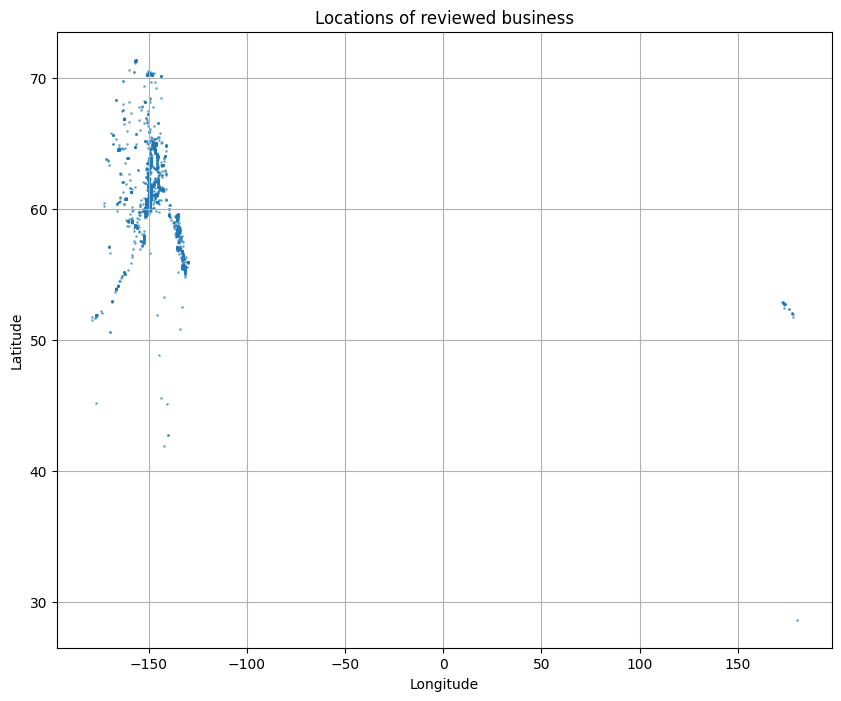

In [13]:
# Select latitude and longitude columns and convert to pandas DataFrame
# It's important to handle potential non-numeric values in latitude and longitude
meta_review_locations_pd = meta_review_sdf.select("latitude", "longitude").toPandas()

# Convert columns to numeric, coercing errors/non-numeric values to NaN
meta_review_locations_pd['latitude'] = pd.to_numeric(meta_review_locations_pd['latitude'], errors='coerce')
meta_review_locations_pd['longitude'] = pd.to_numeric(meta_review_locations_pd['longitude'], errors='coerce')

# Drop rows with NaN values in latitude or longitude
meta_review_locations_pd.dropna(subset=['latitude', 'longitude'], inplace=True)

# Create a scatter plot of the locations
plt.figure(figsize=(10, 8))
plt.scatter(meta_review_locations_pd['longitude'], meta_review_locations_pd['latitude'], alpha=0.5, s=1)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Locations of reviewed business")
plt.grid(True)

# Set the x and y limits
# plt.xlim(meta_review_locations_pd['longitude'].min(), meta_review_locations_pd['longitude'].max())
# plt.ylim(meta_review_locations_pd['latitude'].min(), meta_review_locations_pd['latitude'].max())

plt.show()

Let's build in an interactive map of the business location

In [14]:
!pip install folium

In [15]:
import folium

# map centered around the approximate mean of your locations
map_center_lat = meta_review_locations_pd['latitude'].mean()
map_center_lon = meta_review_locations_pd['longitude'].mean()

business_map = folium.Map(location=[map_center_lat, map_center_lon], zoom_start=4)

# Add markers for each business location
# For a large number of points, consider using MarkerCluster or other techniques for performance
for index, row in meta_review_locations_pd.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=0.5,
        color='orange',
        fill_opacity=0.5
    ).add_to(business_map)

# Display the map
display(business_map)

all the reviews are in Alaska,USA

# Part 1
---



## Q1.1 Some Data Wrangling

### Q1.1.1 replace null in `text` column to "no review"

In [16]:
# Calculate the total number of rows
total_rows = spark.sql("SELECT COUNT(*) FROM reviews").collect()[0][0]

# Calculate the number of rows where 'text' is null
null_text_count = spark.sql("SELECT COUNT(*) FROM reviews WHERE text IS NULL").collect()[0][0]

# Calculate the percentage of null values
percentage_null_text = (null_text_count / total_rows) * 100 if total_rows > 0 else 0

print(f"Total number of rows in reviews: {total_rows}")
print(f"Number of rows with null text: {null_text_count}")
print(f"Percentage of null values in 'text' column: {percentage_null_text:.2f}%")

Total number of rows in reviews: 552624
Number of rows with null text: 249931
Percentage of null values in 'text' column: 45.23%


In [17]:
# Replace null values in 'text' column with "No Review"
review_sdf = review_sdf.fillna({"text": "No Review"})

### Q1.1.2 Change the format of time
* in the `time` column, convert the strings from time to `yyyy-mm-dd` format
in the new column as `newtime` and show the first 5 rows.

In [18]:
spark.sql("SELECT count(*) FROM reviews where time is NULL").show()
print(f"{(24815/552424)*100:.2f}% values are null in time")

+--------+
|count(1)|
+--------+
|   24815|
+--------+

4.49% values are null in time


In [19]:
from pyspark.sql.functions import from_unixtime, to_timestamp, col

# Convert 'time' column (assuming it's in milliseconds) to timestamp and then format to 'yyyy-MM-dd'
# The 'time' column seems to be in string format and potentially milliseconds based on summary stats.
# first convert to timestamp and then formatting.
review_sdf = review_sdf.withColumn("newtime",
                                 from_unixtime(col("time") / 1000, "yyyy-MM-dd"))

# Handle potential errors or different formats in the 'time' column if the above doesn't work
# You might need more robust parsing if the 'time' column has mixed formats.
# For example, if some values are already in a readable date string format, you might use to_timestamp with different formats.

print("Review DataFrame with newtime column:")
review_sdf.select("time", "newtime").show(5, truncate=False)

Review DataFrame with newtime column:
+-------------+----------+
|time         |newtime   |
+-------------+----------+
|1520663824616|2018-03-10|
|1343946019370|2012-08-02|
|1608311022785|2020-12-18|
|1572987681590|2019-11-05|
|1575342018108|2019-12-03|
+-------------+----------+
only showing top 5 rows



`newtime` is simply the converted `time` as new `date`

the dates in the newtime column are based on the UTC representation of the original timestamps. Tthe conversion process uses UTC as the reference.

## Q1.2 Info for `gmap_id` on the `review`

### Q1.2.1 using pyspark, calculate the number of reviews for each unique `gmap_id`
(save as float format in pyspark dataframe to show the top 5 rows)

In [20]:
from pyspark.sql.functions import sum as spark_sum
from pyspark.sql.functions import col

Calculation based on the Review Dataset review_sdf

In [21]:
review_sdf_counts_spark = review_sdf.groupBy("gmap_id").count().withColumn("count", col("count").cast("float"))

In [22]:
review_sdf_counts_spark.orderBy(col("count").desc()).show(5)

+--------------------+-------+
|             gmap_id|  count|
+--------------------+-------+
|                NULL|46309.0|
|0x56c897b9ce6000d...| 2737.0|
|0x56c899d05892048...| 2555.0|
|0x56c897c63697ee3...| 2220.0|
|0x56c8965ee2fb87a...| 2202.0|
+--------------------+-------+
only showing top 5 rows



In [23]:
# Cross-checking the counting results
review_sdf_counts_spark.agg(spark_sum("count")).collect()[0][0] # expected to match the no. of rows as 552624

552624.0

### Q1.2.2 convert the pyspark df to pandas df
* create a new column `review_time` with the info of review time on hours level, add in the pandas df.
* show top 5 rows

In [24]:
df = review_sdf.toPandas() # transform the current pyspark dataframe to pandas dataframe

In [25]:
df["time"].head(10)

,time
0,1525676908252
1,1368006776281
2,1569090797829
3,1597542582178
4,1598037847651
5,None
6,1549419589149
7,"""{'time': 1598807097467, 'text': """"We all appr..."
8,1495309866441
9,1562915528083


In [26]:
import re

def clean_and_convert(val):
    try:
        if pd.isnull(val):
            return pd.NaT

        # Directly handle numeric values
        if isinstance(val, (int, float)):
            return pd.to_datetime(int(val), unit="ms")

        # Handle dictionary-like objects
        if isinstance(val, dict) and "time" in val:
            return pd.to_datetime(int(val["time"]), unit="ms")

        # Convert to string and strip whitespace
        val_str = str(val).strip()

        # Try to extract timestamp from dictionary-like string
        match = re.search(r"[\"']?time[\"']?\s*:\s*(\d{13})", val_str)
        if match:
            return pd.to_datetime(int(match.group(1)), unit="ms")

        # Fallback: check if the string itself is a 13-digit number
        if re.fullmatch(r"\d{13}", val_str):
            return pd.to_datetime(int(val_str), unit="ms")

    except Exception:
        pass

    return pd.NaT

In [27]:
df["review_time"] = df["time"].apply(clean_and_convert) # create the column reivew_time with the information of review time

In [28]:
df[["time", "review_time"]].sample(20)

,time,review_time
332108,1592347159966,2020-06-16 22:39:19.966
60638,1565723066733,2019-08-13 19:04:26.733
523197,1577675650218,2019-12-30 03:14:10.218
515707,1619886536124,2021-05-01 16:28:56.124
260406,1474827105242,2016-09-25 18:11:45.242
69052,1479339732074,2016-11-16 23:42:12.074
417457,1560699902951,2019-06-16 15:45:02.951
201776,1532986441758,2018-07-30 21:34:01.758
93597,1547755093351,2019-01-17 19:58:13.351
444954,None,NaT


In [29]:
df["review_hour"] = df["review_time"].apply(lambda x: int(x.hour) if pd.notnull(x) else None)
df[["time", "review_time", "review_hour"]].sample(20)

,time,review_time,review_hour
164868,"where you can be seated and served as well.""",NaT,NaN
492518,1597834510831,2020-08-19 10:55:10.831,10.0
33790,1596600180517,2020-08-05 04:03:00.517,4.0
198854,1539660683922,2018-10-16 03:31:23.922,3.0
79366,1561240429447,2019-06-22 21:53:49.447,21.0
262051,1504895334247,2017-09-08 18:28:54.247,18.0
107483,1497369086635,2017-06-13 15:51:26.635,15.0
9937,1616890953600,2021-03-28 00:22:33.600,0.0
44685,1563088168166,2019-07-14 07:09:28.166,7.0
99917,1556219896691,2019-04-25 19:18:16.691,19.0


In [30]:
df["review_hour"] = df["review_hour"].astype("Int64")
df["review_time"] = df["review_hour"]
df = df.drop("review_hour", axis=1)
df.head(20)

,user_id,name,time,rating,text,pics,resp,gmap_id,newtime,review_time
0,1.1199583254827408e+20,rudd plate,1525676908252,5,"One of my favorite spots in girdwood, food is ...",None,None,0x56c87b49c26f5107:0xec4056657ef54014,2018-05-07,7
1,1.0478867993645928e+20,tabusoro 2018,1368006776281,5,My wife and I went down to check out some prop...,None,None,0x56c8de19a2d52fb9:0xd4de9f782a9ea8d0,2013-05-08,9
2,1.0931108707710702e+20,Max Berry,1569090797829,5,A haven for spoiled dogs. The absolute best k...,None,"{'time': 1573931035889, 'text': 'Hi Max,\nThan...",0x56c899d4b406a22f:0x17bbaf5c2b5d5e6d,2019-09-21,18
3,1.0752206066654141e+20,bryan leggieri,1597542582178,5,No Review,None,None,0x51325ab55e36bf49:0x2d274b98cb425902,2020-08-16,1
4,1.0043345819386066e+20,Robert Walker,1598037847651,5,Excellent prices and very professional staff,None,None,0x56c8de139d65cb69:0xf0491769409e7959,2020-08-21,19
5,Marco T's has officially earned my a spot on m...,None,None,None,No Review,None,None,None,None,<NA>
6,1.1434038596819003e+20,Derrick Spain,1549419589149,5,the Knik pizza was awesome. lots of options an...,None,None,0x56c8e0bd31c76473:0xdea4696a0c45fd8d,2019-02-06,2
7,"course in Alaska.""",None,"""{'time': 1598807097467, 'text': """"We all appr...",I believe we have the best course in Alaska a...,0x56c91d88841c3625:0x2ecd4d1a74fecbae,None,None,None,None,17
8,1.0845867497873875e+20,Pinkie Pie,1495309866441,5,No Review,None,None,0x513244cdbc58b5ab:0x4e07ddb288998e,2017-05-20,19
9,1.0711897751685569e+20,Jaimee Buzga,1562915528083,3,No Review,None,None,0x56c1320b8fe2e389:0xb356c28fe92eca6b,2019-07-12,7


In [31]:
invalid_rows = df[df["review_time"].isna()]
print(invalid_rows[["time", "review_time"]])

        time  review_time
5       None         <NA>
22      None         <NA>
46      None         <NA>
49      None         <NA>
63      None         <NA>
...      ...          ...
552562  None         <NA>
552580  None         <NA>
552598  None         <NA>
552605  None         <NA>
552623  None         <NA>

[29897 rows x 2 columns]


In [32]:
def contains_timestamp(val):
    if isinstance(val, str):
        match = re.search(r"\b\d{13}\b", val)
        return bool(match)
    return False

In [33]:
print(invalid_rows[~invalid_rows["time"].isna()]["time"])
print()

mask = invalid_rows["time"].notnull() & invalid_rows["time"].apply(contains_timestamp)
shortlist = invalid_rows[mask]

print(shortlist[["time"]]) # emptiness means no more entries with extractable 13-digit timestamps

225        super soggy bread and the cheese choice was b...
276        could probably spend at least a week eating h...
518        asking me to move it to 5. I rearranged my sc...
837        expecting a call but nothing. I called back a...
924        I took her for a spin and it drove like a new...
                                ...                        
551665     because they have a Specials menu that is...w...
551771                                     Xander and Tina.
551842                there is no way not to give 5 stars."
552280                                  good house fries...
552521     and everything was small to accommodate all c...
Name: time, Length: 5082, dtype: object

Empty DataFrame
Columns: [time]
Index: []


In [34]:
df[["time", "review_time"]].head(10)

,time,review_time
0,1525676908252,7
1,1368006776281,9
2,1569090797829,18
3,1597542582178,1
4,1598037847651,19
5,None,<NA>
6,1549419589149,2
7,"""{'time': 1598807097467, 'text': """"We all appr...",17
8,1495309866441,19
9,1562915528083,7


#### converting pandas.df to spark.sdf [for faster execution]

In [35]:
review_sdf = spark.createDataFrame(df)

### Q1.2.3 Relationship between `gmap_id` and `review_time` [both discrete]
* which time people usually review?
* which time do they review the less amount?
* How many business is reviewed in the morning? [6<= x <12 ; 06:00-11:59]

In [36]:
sns.set_style("whitegrid")

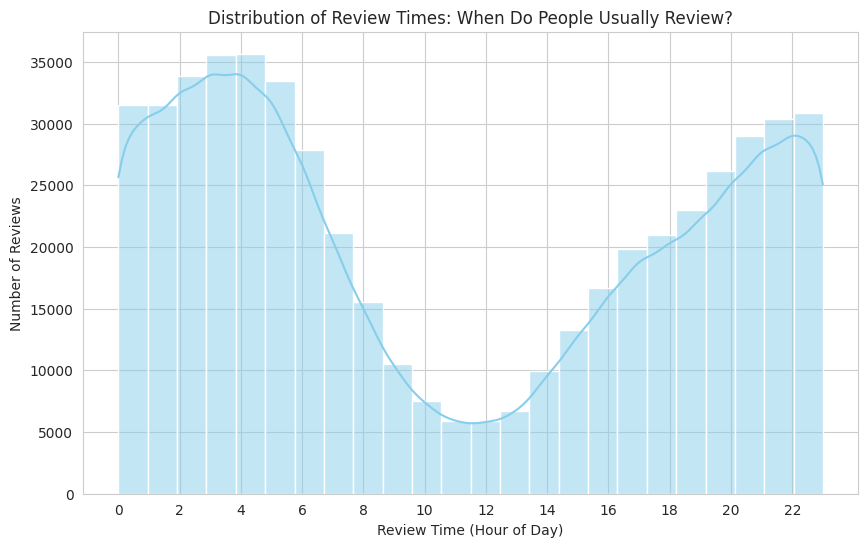

In [37]:
# Visualization 1: Histogram of review_time to see usual review times
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='review_time', bins=24, kde=True, color='skyblue')
plt.xlabel('Review Time (Hour of Day)')
plt.ylabel('Number of Reviews')
plt.title('Distribution of Review Times: When Do People Usually Review?')
plt.xticks(range(0, 24, 2))
plt.show()

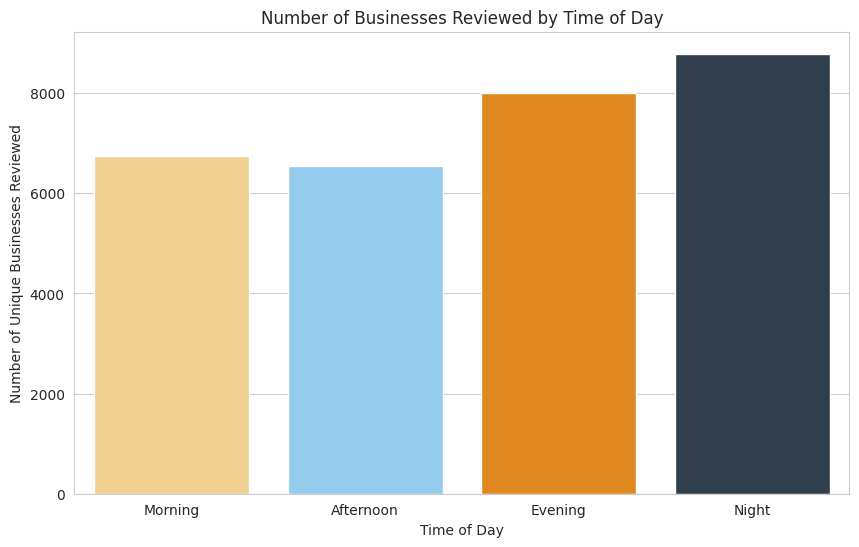

In [38]:
# Visualization 2: Bar plot of unique businesses reviewed per hour bin (morning: 6-12, afternoon: 12-18, evening: 18-24, night: 0-6)
# Create hour bins for categorization
def get_time_bin(hour):
    if 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    elif 18 <= hour < 24:
        return 'Evening'
    else:
        return 'Night'

df['time_bin'] = df['review_time'].apply(get_time_bin)

# Count unique gmap_id per time bin
business_per_bin = df.groupby('time_bin')['gmap_id'].nunique().reset_index()
business_per_bin.columns = ['Time Bin', 'Unique Businesses Reviewed']

time_order = ['Morning', 'Afternoon', 'Evening', 'Night']
custom_palette = {
    'Morning': '#FFD580',    # Soft sunrise gold
    'Afternoon': '#87CEFA',  # Bright sky blue
    'Evening': '#FF8C00',    # Deep orange glow
    'Night': '#2C3E50'       # Midnight navy
}

plt.figure(figsize=(10, 6))
sns.barplot(
    data=business_per_bin,
    x='Time Bin', y='Unique Businesses Reviewed',
    hue='Time Bin', palette=custom_palette, legend=False,
    order=time_order)
plt.xlabel('Time of Day')
plt.ylabel('Number of Unique Businesses Reviewed')
plt.title('Number of Businesses Reviewed by Time of Day')
plt.show()

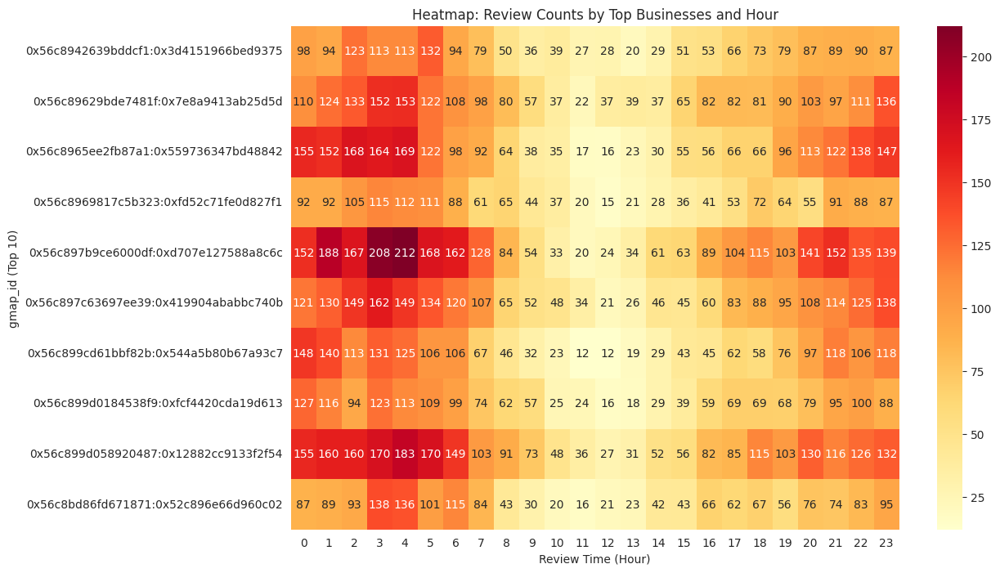

In [39]:
# Visualization 3: Corrected Heatmap of review counts by gmap_id and review_time
top_gmap = df['gmap_id'].value_counts().head(10).index
df_top = df[df['gmap_id'].isin(top_gmap)]

# Pivot table to count occurrences of rows for each gmap_id and review_time combination
pivot_table = df_top.pivot_table(index='gmap_id', columns='review_time', aggfunc='size', fill_value=0)
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, cmap='YlOrRd', fmt='d')
plt.xlabel('Review Time (Hour)')
plt.ylabel('gmap_id (Top 10)')
plt.title('Heatmap: Review Counts by Top Businesses and Hour')
plt.show()

In [ ]:
# [write explanation]
# find out about the user that has given the most reviews

## Q1.3 join `meta-business` with the current df on `gmap_id`

create a `joined_sdf` with all the columns of `meta_review` and the count of review made (`review_count`) for a business in `review_sdf`.

In [40]:
from pyspark.sql.functions import count, col

# Count the number of reviews for each unique gmap_id in review_sdf
review_counts = review_sdf.groupBy("gmap_id").agg(count("*").alias("review_count"))

# Join meta_review_sdf with the review counts on gmap_id
joined_sdf = meta_review_sdf.join(review_counts, on="gmap_id", how="left")

# Show the schema and a few rows of the new joined_sdf
print("Joined DataFrame (joined_sdf) Schema:")
joined_sdf.printSchema()
print("\nJoined DataFrame (joined_sdf) Head:")
joined_sdf.select('review_count')

Joined DataFrame (joined_sdf) Schema:
root
 |-- gmap_id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- address: string (nullable = true)
 |-- description: string (nullable = true)
 |-- latitude: string (nullable = true)
 |-- longitude: string (nullable = true)
 |-- category: string (nullable = true)
 |-- avg_rating: string (nullable = true)
 |-- num_of_reviews: string (nullable = true)
 |-- price: string (nullable = true)
 |-- hours: string (nullable = true)
 |-- MISC: string (nullable = true)
 |-- state: string (nullable = true)
 |-- relative_results: string (nullable = true)
 |-- url: string (nullable = true)
 |-- review_count: long (nullable = true)


Joined DataFrame (joined_sdf) Head:


DataFrame[review_count: bigint]

In [41]:
from pyspark.sql.functions import col

print(f"Number of businesses with no reviews (review_count is None): ")
# Count the number of rows where review_count is null
joined_sdf.filter(col("review_count").isNull()).count()



Number of businesses with no reviews (review_count is None): 


6733

in `review_count`change the null values to 0

In [42]:
# NA review_count to zero (0)

In [43]:
from pyspark.sql.functions import max as spark_max

# Find the maximum value of the 'review_count' column in joined_sdf
max_review_count = joined_sdf.agg(spark_max("review_count").alias("max_review_count"))

# Show the result
print("Maximum review count in joined_sdf:")
max_review_count.show()

Maximum review count in joined_sdf:
+----------------+
|max_review_count|
+----------------+
|            2737|
+----------------+



In [44]:
from pyspark.sql.functions import col

# Order joined_sdf by review_count in descending order and get the top row
business_with_max_reviews = joined_sdf.orderBy(col("review_count").desc()).limit(1)

# Select and show the business name and gmap_id
print("Business with the maximum number of reviews:")
business_with_max_reviews.select("name", "category", "review_count","avg_rating").show()

Business with the maximum number of reviews:
+--------------------+--------------------+------------+----------+
|                name|            category|review_count|avg_rating|
+--------------------+--------------------+------------+----------+
|Moose's Tooth Pub...|['Pizza restauran...|        2737|       4.7|
+--------------------+--------------------+------------+----------+



### Q1.3.1 Find the `workday` with most reviews

In [45]:
from pyspark.sql import functions as F
from pyspark.sql.types import TimestampType
from datetime import datetime

#### Changing time to DateTime in `review_sdf`

In [46]:
# Wrap part of codes in Q1.2.2 as a function for time in extracted as datetime

# Defining a regular function in Python as usual
def parse_time_to_datetime(val):
    """
    Parses various time formats into Python datetime.
    Returns None if parsing fails.
    """
    try:
        if val is None:
            return None

        # Numeric timestamp (int/float)
        if isinstance(val, (int, float)):
            return datetime.fromtimestamp(int(val) / 1000.0)

        # Dict-like string containing "time": 13-digit
        val_str = str(val).strip()
        match = re.search(r'["\']?time["\']?\s*:\s*(\d{13})', val_str)
        if match:
            return datetime.fromtimestamp(int(match.group(1)) / 1000.0)

        # Pure 13-digit string
        if re.fullmatch(r"\d{13}", val_str):
            return datetime.fromtimestamp(int(val_str) / 1000.0)

    except Exception:
        return None
    return None

# Customising function for distributed computation by Spark
parse_time_udf = F.udf(parse_time_to_datetime, TimestampType()) # telling the return type

def extract_review_datetime_spark(spark_df, time_col="time", output_col="review_datetime"):
    """
    Adds a column with parsed datetime from a timestamp-like column in a Spark DataFrame.
    """
    return spark_df.withColumn(output_col, parse_time_udf(F.col(time_col)))

In [47]:
review_sdf = extract_review_datetime_spark(
    review_sdf,
    time_col="time",
    output_col="review_datetime"
)

review_sdf.select("time", "review_datetime").show(10, truncate=False)

+---------------------------------------------------------------------------------------------------------------------------------------+-----------------------+
|time                                                                                                                                   |review_datetime        |
+---------------------------------------------------------------------------------------------------------------------------------------+-----------------------+
|1525676908252                                                                                                                          |2018-05-07 07:08:28.252|
|1368006776281                                                                                                                          |2013-05-08 09:52:56.281|
|1569090797829                                                                                                                          |2019-09-21 18:33:17.829|
|1597542582178              

#### Find the weekday from DateTime

In [48]:
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

# Define a function to extract the day of the week from a datetime object
def get_day_of_week(datetime_obj):
    if datetime_obj:
        return datetime_obj.strftime('%A')  # Returns full weekday name (e.g., Monday, Tuesday)
    return None

# Create a UDF from the Python function
get_day_of_week_udf = udf(get_day_of_week, StringType())

# Apply the UDF to create the new 'review_day' column
review_sdf = review_sdf.withColumn("review_day", get_day_of_week_udf(review_sdf["review_datetime"]))

# Show the schema and some rows to verify the new column
print("Review DataFrame with review_day column:")
review_sdf.select("review_datetime", "review_day").show(10, truncate=False)

Review DataFrame with review_day column:
+-----------------------+----------+
|review_datetime        |review_day|
+-----------------------+----------+
|2018-05-07 07:08:28.252|Monday    |
|2013-05-08 09:52:56.281|Wednesday |
|2019-09-21 18:33:17.829|Saturday  |
|2020-08-16 01:49:42.178|Sunday    |
|2020-08-21 19:24:07.651|Friday    |
|NULL                   |NULL      |
|2019-02-06 02:19:49.149|Wednesday |
|2020-08-30 17:04:57.467|Sunday    |
|2017-05-20 19:51:06.441|Saturday  |
|2019-07-12 07:12:08.083|Friday    |
+-----------------------+----------+
only showing top 10 rows



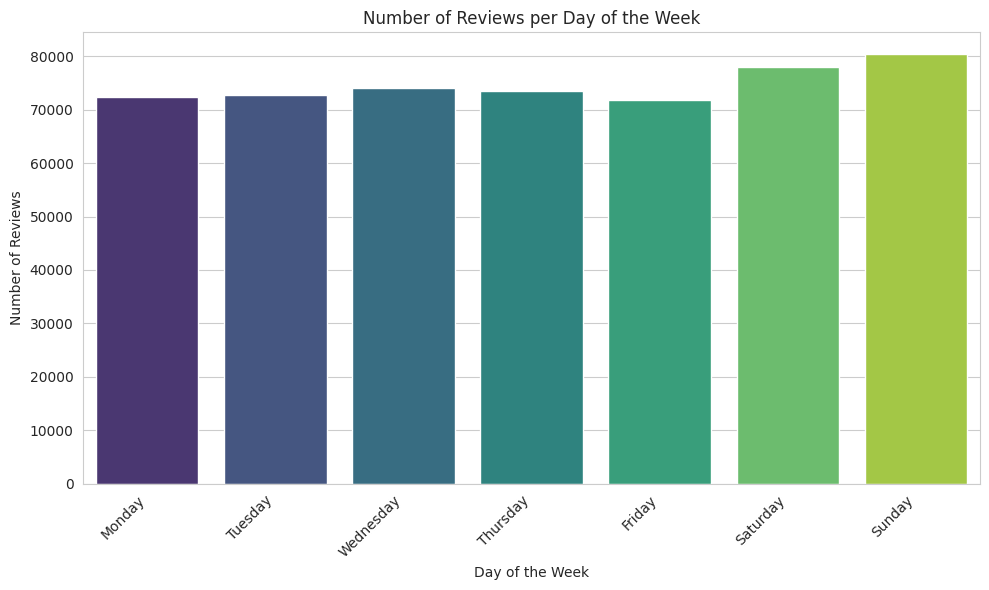

In [49]:
from pyspark.sql.functions import count

# Count the number of reviews for each day of the week
review_counts_by_day = review_sdf.groupBy("review_day").agg(count("*").alias("review_count"))

# Order the days of the week for plotting
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
review_counts_by_day = review_counts_by_day.orderBy(F.col("review_count").desc()) # Order by count for now, will reorder for plot

# Convert to pandas DataFrame for seaborn plotting
review_counts_pd = review_counts_by_day.toPandas()

# Reorder the DataFrame based on the desired day order for the plot
review_counts_pd['review_day'] = pd.Categorical(review_counts_pd['review_day'], categories=day_order, ordered=True)
review_counts_pd = review_counts_pd.sort_values('review_day')


# Create a bar plot using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x="review_day", y="review_count", data=review_counts_pd, palette="viridis", hue="review_day", legend=False)
plt.xlabel("Day of the Week")
plt.ylabel("Number of Reviews")
plt.title("Number of Reviews per Day of the Week")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

`gmap_id` values mismatch among `review` and `meta_review`

In [50]:
# Find gmap_id values in meta_review_sdf but not in review_sdf
gmap_ids_in_meta_not_in_review = meta_review_sdf.join(review_sdf, on="gmap_id", how="left_anti")

print("Number of gmap_id values in meta_review_sdf but not in review_sdf:", gmap_ids_in_meta_not_in_review.count())

# Find gmap_id values in review_sdf but not in meta_review_sdf
gmap_ids_in_review_not_in_meta = review_sdf.join(meta_review_sdf, on="gmap_id", how="left_anti")

print("Number of gmap_id values in review_sdf but not in meta_review_sdf:", gmap_ids_in_review_not_in_meta.count())

Number of gmap_id values in meta_review_sdf but not in review_sdf: 6733
Number of gmap_id values in review_sdf but not in meta_review_sdf: 54173


### Q1.3.2 Category of business name with most reviewed day
* In Sunday (most reviewed day by users), which business (the business `name`) has the highest avg rating [filter by max(avg_rating) in meta business review]
* Find the `category` of the business `name`

In [51]:
from pyspark.sql.functions import col, max as spark_max

# 1. Identify the day with the highest number of reviews (from the previous plot, it's Sunday)
most_reviewed_day = "Sunday"

# 2. Filter the review_sdf for the most reviewed day
reviews_on_peak_day = review_sdf.filter(review_sdf["review_day"] == most_reviewed_day)

# 3. Join with meta_review_sdf on gmap_id
# Select relevant columns from meta_review_sdf and rename 'name' to 'business_name' before the join
meta_review_subset = meta_review_sdf.select(
    "gmap_id",
    col("name").alias("business_name"),
    "category",
    "avg_rating"
)

joined_df = reviews_on_peak_day.join(meta_review_subset, on="gmap_id", how="inner")


# 4. Cast 'avg_rating' to double and find the maximum average rating on that day
# We need to order by avg_rating (desc) and take the first row to get the max
highest_rated_business = joined_df.orderBy(col("avg_rating").cast("double").desc()).limit(1)


# 5. Show the result
print(f"Business with the highest average rating (from meta_review_sdf) on {most_reviewed_day}:")
highest_rated_business.select("gmap_id", "business_name", "category", "avg_rating").show(truncate=False)

Business with the highest average rating (from meta_review_sdf) on Sunday:
+-------------------------------------+------------------+----------------------------------------------------------------------------------------------------------+----------+
|gmap_id                              |business_name     |category                                                                                                  |avg_rating|
+-------------------------------------+------------------+----------------------------------------------------------------------------------------------------------+----------+
|0x56c8de1a8e344a41:0x6035229533edc569|Lane Family Dental|['Dentist', 'Cosmetic dentist', 'Dental hygienist', 'Dental implants provider', 'Teeth whitening service']|5.0       |
+-------------------------------------+------------------+----------------------------------------------------------------------------------------------------------+----------+



#### the business with `most reviews` and `max avg_rating`

In [52]:
from pyspark.sql.functions import col, max as spark_max

# Find the maximum review count in the joined_sdf
max_review_count_value = joined_sdf.agg(spark_max("review_count")).collect()[0][0]

# Filter joined_sdf to get only businesses with the maximum review count
businesses_with_max_reviews = joined_sdf.filter(col("review_count") == max_review_count_value)

# Find the business with the highest average rating among those with the maximum review count
# Need to cast 'avg_rating' to double to find the maximum
highest_rated_among_max_reviews = businesses_with_max_reviews.orderBy(col("avg_rating").cast("double").desc()).limit(1)

# Show the result
print(f"Business with the highest average rating among those with the maximum review count ({max_review_count_value}):")
highest_rated_among_max_reviews.select("name", "gmap_id", "avg_rating", "review_count").show(truncate=False)

Business with the highest average rating among those with the maximum review count (2737):
+----------------------------+-------------------------------------+----------+------------+
|name                        |gmap_id                              |avg_rating|review_count|
+----------------------------+-------------------------------------+----------+------------+
|Moose's Tooth Pub & Pizzeria|0x56c897b9ce6000df:0xd707e127588a8c6c|4.7       |2737        |
+----------------------------+-------------------------------------+----------+------------+



In [53]:
from pyspark.sql.functions import col

# Filter the review_sdf for rows where the rating is '5' and count them
five_star_reviews_count = review_sdf.filter(col("rating") == "5").count()

print(f"Number of reviews with a rating of 5: {five_star_reviews_count}")

Number of reviews with a rating of 5: 298638


#### the business with `max avg_rating` and `most reviews`

#### business with most reviewed in Sunday (the most reviewed day)

In [54]:
from pyspark.sql.functions import col, count, max as spark_max

# 1. Filter review_sdf for reviews on Sunday
sunday_reviews_sdf = review_sdf.filter(col("review_day") == "Sunday")

# 2. Count the number of reviews for each gmap_id on Sunday
sunday_review_counts = sunday_reviews_sdf.groupBy("gmap_id").agg(count("*").alias("sunday_review_count"))

# 3. Find the maximum review count on Sunday
max_sunday_review_count = sunday_review_counts.agg(spark_max("sunday_review_count")).collect()[0][0]

# 4. Filter the Sunday review counts to get gmap_ids with the maximum count
gmap_ids_with_max_sunday_reviews = sunday_review_counts.filter(col("sunday_review_count") == max_sunday_review_count)

# Show the gmap_id(s) with the maximum Sunday review count
print(f"Gmap_id(s) with the maximum number of reviews on Sunday ({max_sunday_review_count}):")
gmap_ids_with_max_sunday_reviews.show(truncate=False)


# 5. Join with meta_review_sdf to get business details for these gmap_ids
business_details_on_max_sunday_reviews = meta_review_sdf.join(gmap_ids_with_max_sunday_reviews, on="gmap_id", how="inner")

# 6. Show the details of the business(es) with the maximum review count on Sunday
print(f"Business(es) with the maximum number of reviews on Sunday ({max_sunday_review_count}):")
business_details_on_max_sunday_reviews.select("name", "category", "avg_rating").show(truncate=False)

Gmap_id(s) with the maximum number of reviews on Sunday (2490):
+-------+-------------------+
|gmap_id|sunday_review_count|
+-------+-------------------+
|NULL   |2490               |
+-------+-------------------+

Business(es) with the maximum number of reviews on Sunday (2490):
+----+--------+----------+
|name|category|avg_rating|
+----+--------+----------+
+----+--------+----------+



In [55]:
from pyspark.sql.functions import col, count, max as spark_max
from pyspark.sql.window import Window
from pyspark.sql.functions import rank

# 1. Filter review_sdf for reviews on Sunday
sunday_reviews_sdf = review_sdf.filter(col("review_day") == "Sunday")

# 2. Count the number of reviews for each gmap_id on Sunday
sunday_review_counts = sunday_reviews_sdf.groupBy("gmap_id").agg(count("*").alias("sunday_review_count"))

# 3. Rank the gmap_ids by their review count on Sunday
window_spec = Window.orderBy(col("sunday_review_count").desc())
ranked_sunday_review_counts = sunday_review_counts.withColumn("rank", rank().over(window_spec))

# 4. Filter to get the gmap_ids with the second highest rank (rank == 2)
gmap_ids_with_second_max_sunday_reviews = ranked_sunday_review_counts.filter(col("rank") == 2).select("gmap_id", "sunday_review_count")

# Show the gmap_id(s) with the second maximum Sunday review count
print("Gmap_id(s) with the second maximum number of reviews on Sunday:")
gmap_ids_with_second_max_sunday_reviews.show(truncate=False)

# 5. Join with meta_review_sdf to get business details for these gmap_ids
business_details_on_second_max_sunday_reviews = meta_review_sdf.join(gmap_ids_with_second_max_sunday_reviews, on="gmap_id", how="inner")

# 6. Show the details of the business(es) with the second maximum review count on Sunday
print("Business(es) with the second maximum number of reviews on Sunday:")
business_details_on_second_max_sunday_reviews.select("name", "category", "avg_rating").show(truncate=False)

Gmap_id(s) with the second maximum number of reviews on Sunday:
+-------------------------------------+-------------------+
|gmap_id                              |sunday_review_count|
+-------------------------------------+-------------------+
|0x56c897b9ce6000df:0xd707e127588a8c6c|411                |
+-------------------------------------+-------------------+

Business(es) with the second maximum number of reviews on Sunday:
+----------------------------+----------------------------------------------------+----------+
|name                        |category                                            |avg_rating|
+----------------------------+----------------------------------------------------+----------+
|Moose's Tooth Pub & Pizzeria|['Pizza restaurant', 'Bar', 'Brewpub', 'Restaurant']|4.7       |
+----------------------------+----------------------------------------------------+----------+



### Q1.3.3 Exploration on that business
* Plot historam for peak hour

In [56]:
# Get the gmap_id
second_max_gmap_id = gmap_ids_with_second_max_sunday_reviews.select("gmap_id").collect()[0][0]

# Filter review_sdf for the specific gmap_id and select the review_time column
reviews_for_second_max_business = review_sdf.filter(col("gmap_id") == second_max_gmap_id).select("review_time")

# Convert the selected review_time column to a pandas DataFrame for plotting
# Drop null values before converting to pandas
reviews_for_second_max_business_pd = reviews_for_second_max_business.dropna(subset=["review_time"]).toPandas()


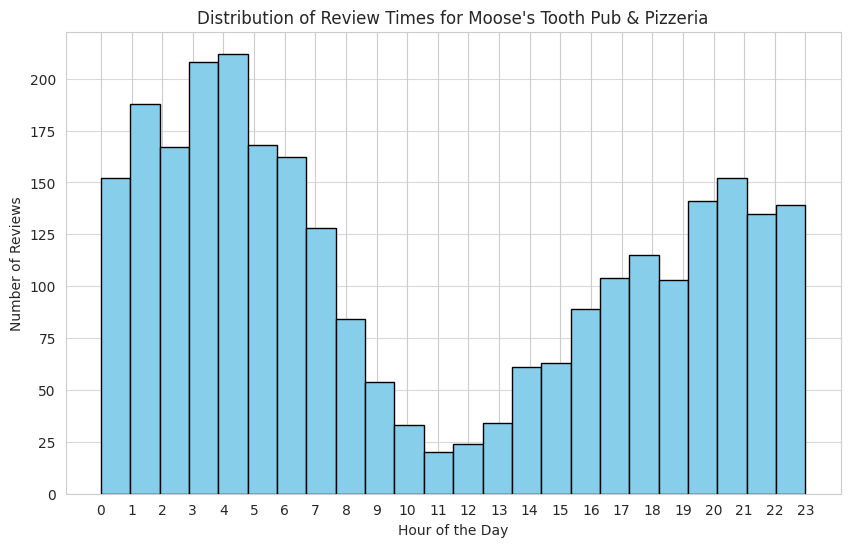

In [57]:
# Plot a histogram of the review_time (which represents the hour)
plt.figure(figsize=(10, 6))
plt.hist(reviews_for_second_max_business_pd["review_time"],
         bins=24, color='skyblue', edgecolor='black')
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Reviews")
plt.title(f"Distribution of Review Times for Moose's Tooth Pub & Pizzeria")
plt.xticks(range(0, 24))
plt.grid(axis='y', alpha=0.75)
plt.show()

The distribution suggests that reviews are more frequent during late night and early morning hours, as well as in the evening, which might align with typical dining or leisure times. The drop in reviews during standard daytime hours could indicate when people are less likely to be submitting reviews.

## Q1.4 Top 30 words by year
* For the reviews on each of the submissions, work on all the review content and find out the `top 30`
most common words;
* Also generate separate `word cloud` visualizations for `different years`( by grouping
the reviews by review year )
* write down the insights in the markdown cell.

In [58]:
from pyspark.sql import functions as F
from pyspark.sql.types import TimestampType
from datetime import datetime

Creating the review_year column

In [59]:
# Wrap part of codes in Q1.2.2 as a function for time in extracted as datetime

# Defining a regular function in Python as usual
def parse_time_to_datetime(val):
    """
    Parses various time formats into Python datetime.
    Returns None if parsing fails.
    """
    try:
        if val is None:
            return None

        # Numeric timestamp (int/float)
        if isinstance(val, (int, float)):
            return datetime.fromtimestamp(int(val) / 1000.0)

        # Dict-like string containing "time": 13-digit
        val_str = str(val).strip()
        match = re.search(r'["\']?time["\']?\s*:\s*(\d{13})', val_str)
        if match:
            return datetime.fromtimestamp(int(match.group(1)) / 1000.0)

        # Pure 13-digit string
        if re.fullmatch(r"\d{13}", val_str):
            return datetime.fromtimestamp(int(val_str) / 1000.0)

    except Exception:
        return None
    return None

# Customising function for distributed computation by Spark
parse_time_udf = F.udf(parse_time_to_datetime, TimestampType()) # telling the return type

def extract_review_datetime_spark(spark_df, time_col="time", output_col="review_datetime"):
    """
    Adds a column with parsed datetime from a timestamp-like column in a Spark DataFrame.
    """
    return spark_df.withColumn(output_col, parse_time_udf(F.col(time_col)))

In [60]:
review_sdf_with_datetime = extract_review_datetime_spark(
    review_sdf,
    time_col="time",
    output_col="review_datetime"
)

review_sdf_with_datetime.select("time", "review_datetime").show(10, truncate=False)

+---------------------------------------------------------------------------------------------------------------------------------------+-----------------------+
|time                                                                                                                                   |review_datetime        |
+---------------------------------------------------------------------------------------------------------------------------------------+-----------------------+
|1525676908252                                                                                                                          |2018-05-07 07:08:28.252|
|1368006776281                                                                                                                          |2013-05-08 09:52:56.281|
|1569090797829                                                                                                                          |2019-09-21 18:33:17.829|
|1597542582178              

In [61]:
df_dt = review_sdf_with_datetime.toPandas() # transform the current pyspark dataframe to pandas dataframe
df_dt.columns

Index(['user_id', 'name', 'time', 'rating', 'text', 'pics', 'resp', 'gmap_id',
       'newtime', 'review_time', 'review_datetime', 'review_day'],
      dtype='object')

In [62]:
df_dt['review_datetime'] = pd.to_datetime(df_dt['review_datetime'], errors='coerce')
df_dt['review_year'] = df_dt['review_datetime'].dt.year.astype("Int64")
df_dt.columns

Index(['user_id', 'name', 'time', 'rating', 'text', 'pics', 'resp', 'gmap_id',
       'newtime', 'review_time', 'review_datetime', 'review_day',
       'review_year'],
      dtype='object')

In [63]:
df_dt.head(10)

,user_id,name,time,rating,text,pics,resp,gmap_id,newtime,review_time,review_datetime,review_day,review_year
0,1.1199583254827408e+20,rudd plate,1525676908252,5,"One of my favorite spots in girdwood, food is ...",None,None,0x56c87b49c26f5107:0xec4056657ef54014,2018-05-07,7.0,2018-05-07 07:08:28.252,Monday,2018
1,1.0478867993645928e+20,tabusoro 2018,1368006776281,5,My wife and I went down to check out some prop...,None,None,0x56c8de19a2d52fb9:0xd4de9f782a9ea8d0,2013-05-08,9.0,2013-05-08 09:52:56.281,Wednesday,2013
2,1.0931108707710702e+20,Max Berry,1569090797829,5,A haven for spoiled dogs. The absolute best k...,None,"{'time': 1573931035889, 'text': 'Hi Max,\nThan...",0x56c899d4b406a22f:0x17bbaf5c2b5d5e6d,2019-09-21,18.0,2019-09-21 18:33:17.829,Saturday,2019
3,1.0752206066654141e+20,bryan leggieri,1597542582178,5,No Review,None,None,0x51325ab55e36bf49:0x2d274b98cb425902,2020-08-16,1.0,2020-08-16 01:49:42.178,Sunday,2020
4,1.0043345819386066e+20,Robert Walker,1598037847651,5,Excellent prices and very professional staff,None,None,0x56c8de139d65cb69:0xf0491769409e7959,2020-08-21,19.0,2020-08-21 19:24:07.651,Friday,2020
5,Marco T's has officially earned my a spot on m...,None,None,None,No Review,None,None,None,None,NaN,NaT,None,<NA>
6,1.1434038596819003e+20,Derrick Spain,1549419589149,5,the Knik pizza was awesome. lots of options an...,None,None,0x56c8e0bd31c76473:0xdea4696a0c45fd8d,2019-02-06,2.0,2019-02-06 02:19:49.149,Wednesday,2019
7,"course in Alaska.""",None,"""{'time': 1598807097467, 'text': """"We all appr...",I believe we have the best course in Alaska a...,0x56c91d88841c3625:0x2ecd4d1a74fecbae,None,None,None,None,17.0,2020-08-30 17:04:57.467,Sunday,2020
8,1.0845867497873875e+20,Pinkie Pie,1495309866441,5,No Review,None,None,0x513244cdbc58b5ab:0x4e07ddb288998e,2017-05-20,19.0,2017-05-20 19:51:06.441,Saturday,2017
9,1.0711897751685569e+20,Jaimee Buzga,1562915528083,3,No Review,None,None,0x56c1320b8fe2e389:0xb356c28fe92eca6b,2019-07-12,7.0,2019-07-12 07:12:08.083,Friday,2019


Tokenization

In [64]:
# Function to clean and tokenize
def clean_tokenize(text):
    if pd.isnull(text):
        return []
    text = text.lower()
    text = re.sub(r"[^a-z\s]", "", text)  # keep only letters and spaces
    return text.split()

In [65]:
# Apply function to create a 'words' column
df_dt["words"] = df_dt["text"].apply(clean_tokenize)

# Explode the list of words into separate rows
words_df = df_dt.explode("words")

# Drop empty strings if any
words_df = words_df[words_df["words"] != ""]

# Count word frequencies
word_counts = (
    words_df.groupby("words")
    .size()
    .reset_index(name="count")
    .sort_values(by="count", ascending=False)
)

In [66]:
# Top 30 overall
top30_words = word_counts.head(30)
top30_words.insert(0, "rank", range(1, len(top30_words) + 1))
print(top30_words.to_string(index=False))

 rank   words  count
    1      no 260023
    2  review 250762
    3     the 236974
    4     and 203328
    5       a 130257
    6      to 125101
    7       i  93435
    8   great  80651
    9      is  74563
   10     was  73728
   11      of  72303
   12     for  70198
   13      in  66347
   14    good  61911
   15    food  60870
   16      it  53529
   17    they  49269
   18   place  46149
   19 service  43820
   20     you  41555
   21      my  40136
   22     but  39520
   23    very  38124
   24    with  37426
   25     are  36329
   26    have  34698
   27    this  33786
   28      on  31202
   29     not  28472
   30    that  28304


Grouping the reviews by review_year

In [67]:
min_year = df_dt["review_year"].min()
max_year = df_dt["review_year"].max()

print(f"Review years range from {min_year} to {max_year}")

Review years range from 2007 to 2021


In [68]:
# Count word frequencies per year
word_counts_by_year = (
    words_df.groupby(["review_year", "words"])
    .size()
    .reset_index(name="count")
    .sort_values(["review_year", "count"], ascending=[True, False])
)

# Get top 30 words for each year
top30_words_by_year = (
    word_counts_by_year.groupby("review_year")
    .head(30)  # top 30 per year
    .reset_index(drop=True)
)

In [69]:
top30_words_by_year # DataFrame of the top 30 most frequent words for each review year

,review_year,words,count
0,2007,has,2
1,2007,a,1
2,2007,also,1
3,2007,bar,1
4,2007,beausoleil,1
...,...,...,...
435,2021,have,2427
436,2021,this,2400
437,2021,on,2109
438,2021,not,1978


In [70]:
#import random

# Selecting a random review year from available data and display its top 30 words
#random_year = random.choice(df_dt["review_year"].dropna().unique())
#top30_random_year = top30_words_by_year[
#    top30_words_by_year["review_year"] == random_year
#]

#print(top30_random_year)

In [71]:
# Expanded expression for each year
print("The top 30 most frequent words for each review year")
for yr in range(min_year, max_year + 1):
    print(f"\nReview year: {yr}")
    #mask = top30_words_by_year["review_year"] == yr
    #filtered_years = df_dt[mask]["review_year"].dropna().unique()
    #print(filtered_years)
    print(top30_words_by_year[top30_words_by_year["review_year"] == yr])

The top 30 most frequent words for each review year

Review year: 2007
    review_year        words  count
0          2007          has      2
1          2007            a      1
2          2007         also      1
3          2007          bar      1
4          2007   beausoleil      1
5          2007      closest      1
6          2007         food      1
7          2007        homer      1
8          2007      hosting      1
9          2007           in      1
10         2007        music      1
11         2007  respectable      1
12         2007          the      1
13         2007        thing      1
14         2007           to      1
15         2007         town      1
16         2007        venue      1
17         2007           we      1
18         2007         were      1
19         2007         when      1

Review year: 2008
    review_year      words  count
20         2008        the     41
21         2008          a     22
22         2008        and     22
23         2008   

Generating the word cloud visualizations for different years

In [72]:
!pip install wordcloud
from wordcloud import WordCloud

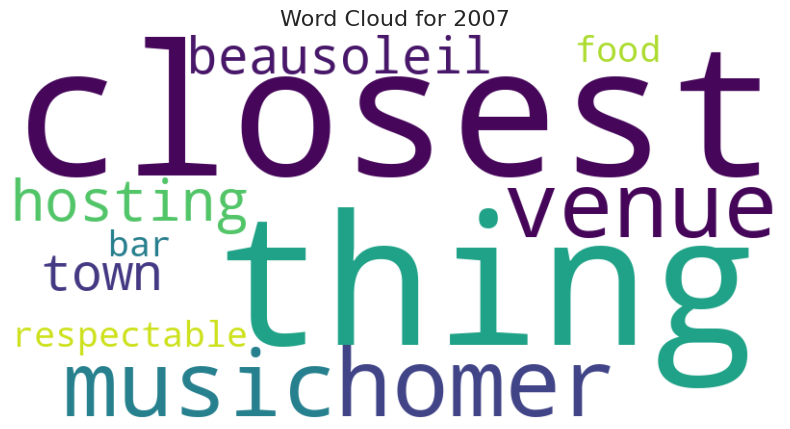

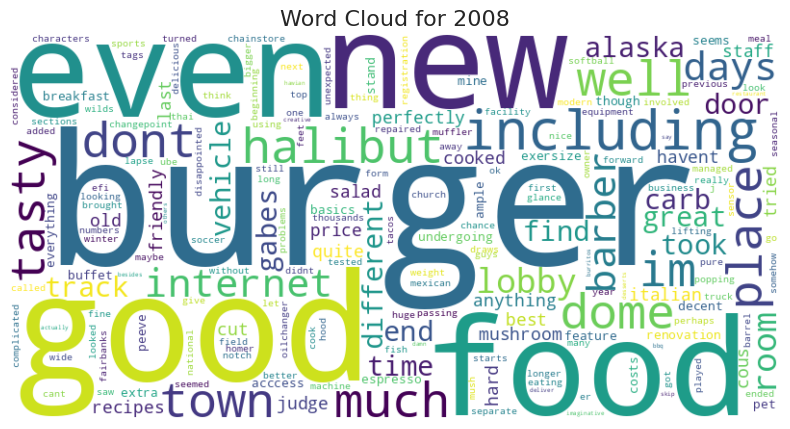

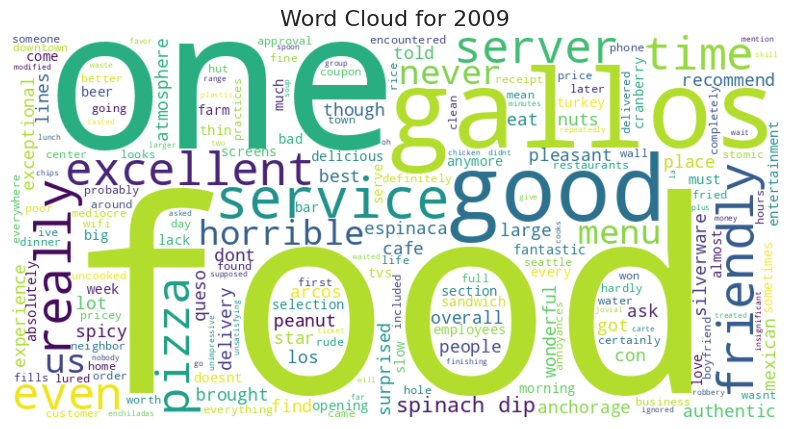

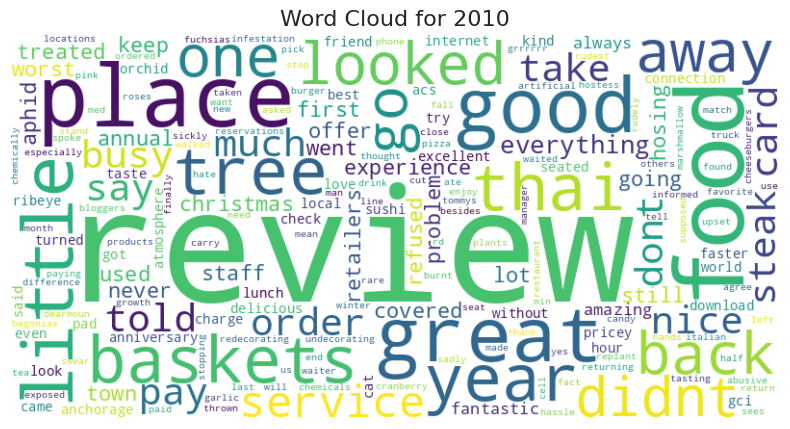

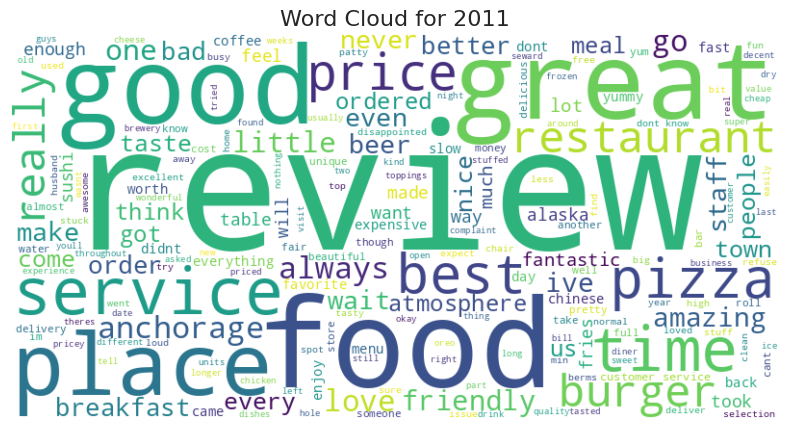

...

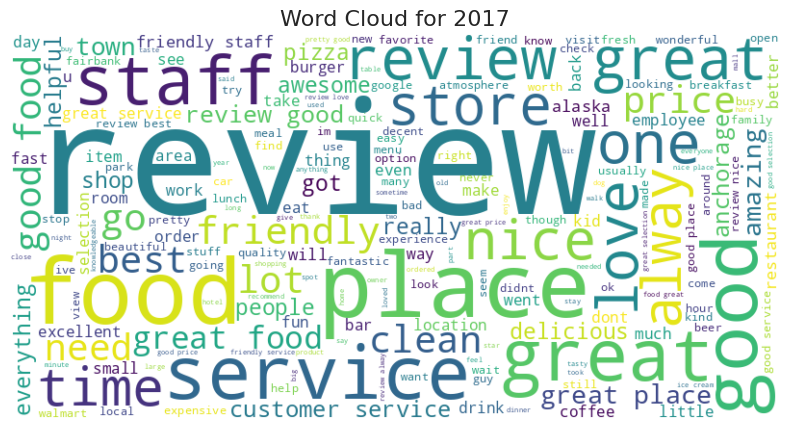

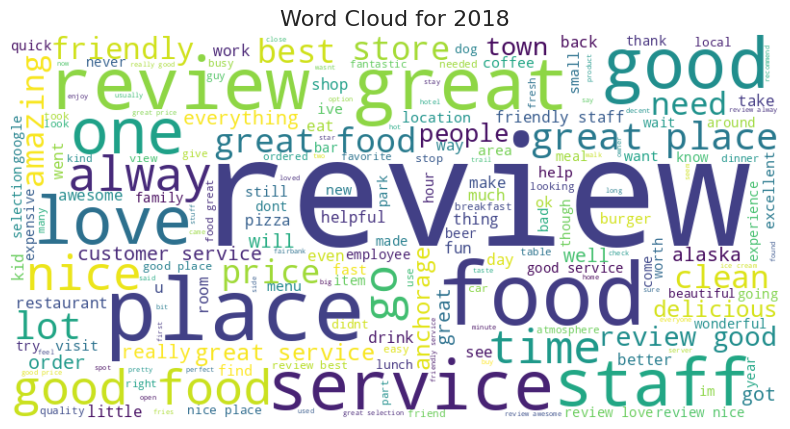

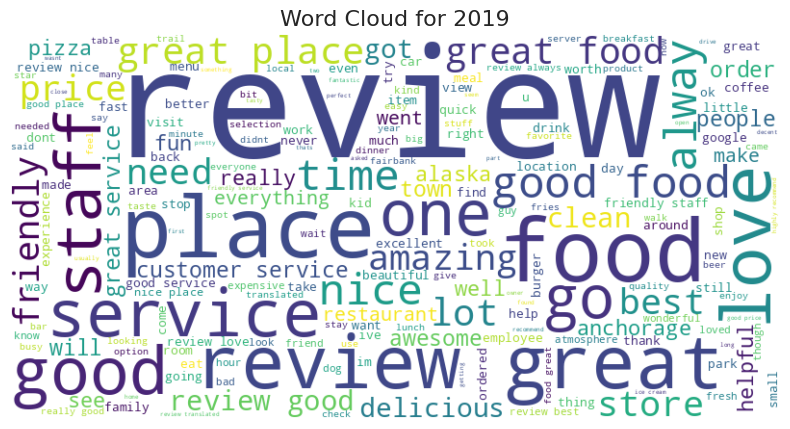

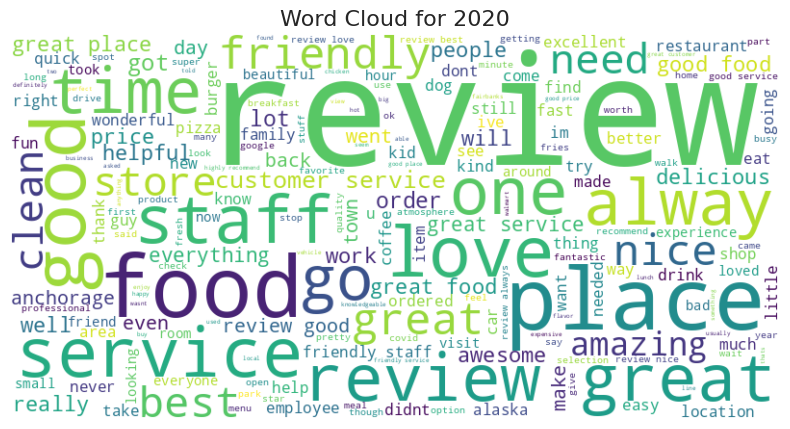

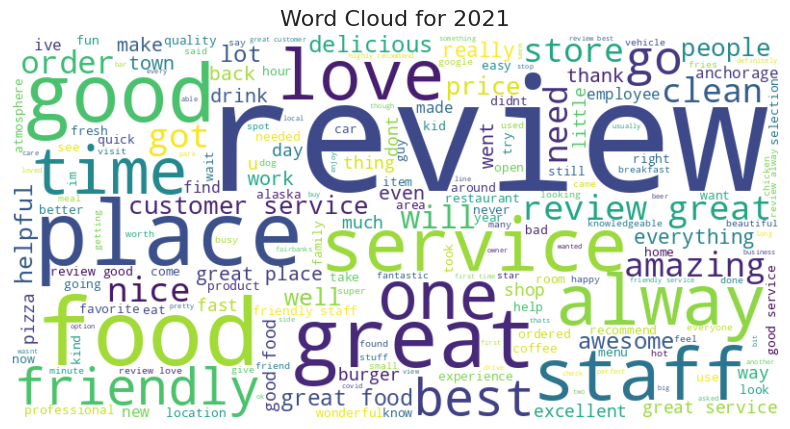

In [73]:
# Looping through each year and generate a word cloud
years = sorted(df_dt["review_year"].dropna().unique())

for year in years:
    # Select words for this year, drop NaN, convert to string
    words_list = (
        words_df.loc[words_df["review_year"] == year, "words"]
        .dropna()
        .astype(str)
    )

    text_for_year = " ".join(words_list) # join into one big string

    if not text_for_year.strip():
        continue  # skip if no text

    wc = WordCloud(
        width=800,
        height=400,
        background_color="white",
        max_words=200,
        colormap="viridis"
    ).generate(text_for_year)

    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for {year}", fontsize=16)
    plt.show()

Insights from the visualized results

1. Expansion of Review Volume and Engagement
*   Word counts grow from negligible levels in 2007 (e.g., "*has*" at 2) to tens of thousands by 2017–2019 (e.g., "*the*" at 72,845 in 2019).  
*   Reflects rising user motivation as platforms matured and awareness spread.  
*   Early sparsity (2007–2010) suggests niche users logging basic visits.  
*   Post-2015 surge indicates viral sharing and habitual reviewing for validation or influence.  

2. Rise of Positive Descriptors
*   Words like "*great"* (peaking at 25,293 in 2019) and "*good"* (19,593 in 2019) dominate later years.  
*   High frequency of positive adjectives suggests reviewers often frame experiences in broadly favourable terms, though this does not directly evidence motivation.  
*   "*Friendly"* and "*nice"* surge in 2017–2021 (e.g., "*friendly*" at 4,596 in 2020), highlighting relational praise.  
*   Early positives like "*excellent"* (2009) evolve into broader enthusiasm, signaling improving standards.  

3. Food as a Central Review Driver
*   "*Food"* rises from 4 mentions in 2008 to 19,425 in 2019.  
*   Customers motivated to share culinary highs/lows for guidance or catharsis.  
*   Specific items (e.g., "*burgers"* in 2008, "*dip"* in 2009) fade over time.  
*   Shift toward general acclaim suggests maturity from novelty to expectation-setting.  
*   Paired with "*great/good"*, reviews emphasize satisfaction over complaints.  

4. Service and Staff as Loyalty Builders
*   "*Service"* grows from 35 in 2011 to 13,403 in 2019.  
*   "*Staff"* emerges strongly from 2016 (1,228 rising to 8,197 in 2019).  
*   Reflects motivation to affirm personalized interactions.  
*   "*Friendly"* ties in post-2017, showing warmth as a loyalty booster.  
*   Early mentions (2009) are sparse, later evolving into critique/resolution narratives.  

5. Atmosphere and Place as Experience Shapers
*   "*Place"* grows from 8 in 2010 to 14,833 in 2019.  
*   "*Nice"* (1,322 in 2016 onward) highlights ambiance as a review driver.  
*   Complements early terms like "*venue"* (2007) and "*town"* (2007).  
*   Shift from location-specific mentions to holistic vibe assessments.  
*   Motivates aspirational sharing, especially in urban/competitive contexts.  

6. Pronouns Reflect Personal and Experiential Narratives
*   High use of "*I/my"* (567/194 in 2014) and "*we/you"* (peaking variably).  
*   Indicates reviews are framed as personal stories for relatability.  
*   "*They/them"* rises to 14,392 in 2019, attributing outcomes to staff/business.  
*   Sustained "*this/that"* usage frames specific incidents, fueling emotional venting or celebration.  

7. Shifts in Specificity Over Time
*   Early years (2007–2009) feature unique nouns ("*beausoleil,*" "*gallos,*" "*dome").  
*   Reflects novelty-driven logs in the initial adoption phase.  
*   Post-2010, reviews generalize to "*food/service"*, showing routine evaluation.  
*   Decline in business-specific terms reflects broader platform use beyond local contexts.  
*   Users are increasingly motivated by comparative insights over isolated events.  

8. Balanced Sentiment with Nuanced Caveats
*   "*But"* and "*not"* rise from 7/4 in 2008 to 12,052/8,447 in 2019.  
*   Indicates qualified praise or mild gripes as common review structures.  
*   Words like "*even"* (2008) and "*ever"* (2009) add emphasis to extremes.  
*   The frequent use of "*very*" (11,990 in 2019) reflects its role as a neutral intensifier, showing that reviewers often amplify descriptions, though the direction (positive or negative) depends on the adjective it modifies.

9. Recommendation-Oriented Language
*   Action words like "*for"* (21,263 in 2019) and "*to"* (37,918 in 2019) dominate.  
*   "*Have/had"* reflects experiential recall, reinforcing advisory tone.  
*   Peaks during high-engagement years post-2010.  

10. Resilience During Disruptions
*   Review volume dips in 2020–2021 (e.g., by the drop in "*the*" from 72,845  in 2019 to 39,158).
*   Despite lower volume, core terms remain prominent ("*great,*" "*food,*" "*service*"), indicating continuity in review language even during disruptions.
*   "*Friendly"* (4,813) and "*staff"* (4,596) hold strong in 2020.  
*   Highlights enduring trust-building and human focus during crises.  

## Q1.5 Analysis on business `name` and `review`
* find the number of unique business `reviewers` and its `category` (find out the highest distinct count of reviewers on business / category level) [who has reviewed the most? for a category?]
* When `reviewers` submitted their review? [add visualization and write in markdown]

In [74]:
print(f"Number of unique users that have given review:")
review_sdf.select("user_id").distinct().count()

Number of unique users that have given review:


45569

#### Who has given the most reviews?

In [75]:
from pyspark.sql.functions import count, col, desc, countDistinct

# Count the number of reviews and distinct gmap_id for each user
user_review_summary = review_sdf.groupBy("user_id").agg(
    count("*").alias("total_reviews"),
    countDistinct("gmap_id").alias("distinct_businesses_reviewed")
)

# Find the user with the maximum number of reviews
user_with_most_reviews = user_review_summary.orderBy(col("total_reviews").desc()).limit(1)

# Show the results
print("User with the most reviews:")
user_with_most_reviews.show(truncate=False)

# name in review_sdf is the user's name):
user_with_most_reviews_with_name = user_with_most_reviews.join(
    review_sdf.select("user_id", "name").distinct(),
    on="user_id",
    how="inner"
)

print("\nDetails for the user with the most reviews:")
user_with_most_reviews_with_name.select("user_id", "name", "total_reviews", "distinct_businesses_reviewed").show(truncate=False)

User with the most reviews:
+----------+-------------+----------------------------+
|user_id   |total_reviews|distinct_businesses_reviewed|
+----------+-------------+----------------------------+
|(Original)|3606         |0                           |
+----------+-------------+----------------------------+


Details for the user with the most reviews:
+----------+----+-------------+----------------------------+
|user_id   |name|total_reviews|distinct_businesses_reviewed|
+----------+----+-------------+----------------------------+
|(Original)|NULL|3606         |0                           |
+----------+----+-------------+----------------------------+



Since, no exact information was found for the most review giver, let's look for the 2nd most review giver

In [76]:
from pyspark.sql.functions import count, col, desc, countDistinct, rank
from pyspark.sql.window import Window

# 1. Count the number of reviews and distinct gmap_id for each user
user_review_summary = review_sdf.groupBy("user_id").agg(
    count("*").alias("total_reviews"),
    countDistinct("gmap_id").alias("distinct_businesses_reviewed")
)

# 2. Rank the users based on their total review count
window_spec = Window.orderBy(col("total_reviews").desc())
ranked_users = user_review_summary.withColumn("rank", rank().over(window_spec))

# 3. Filter to get the user(s) with the second highest rank (rank == 2)
user_with_second_most_reviews = ranked_users.filter(col("rank") == 2).select("user_id", "total_reviews", "distinct_businesses_reviewed")

# 4. Show the results
print("User(s) with the second most reviews:")
user_with_second_most_reviews.show(truncate=False)

# Optional: Join with review_sdf to get the name(s) if needed
user_with_second_most_reviews_with_name = user_with_second_most_reviews.join(
    review_sdf.select("user_id", "name").distinct(),
    on="user_id",
    how="inner"
)

print("\nDetails for the user(s) with the second most reviews:")
user_with_second_most_reviews_with_name.select("user_id", "name", "total_reviews", "distinct_businesses_reviewed").show(truncate=False)

User(s) with the second most reviews:
+----------------------+-------------+----------------------------+
|user_id               |total_reviews|distinct_businesses_reviewed|
+----------------------+-------------+----------------------------+
|1.0188830200557922e+20|397          |347                         |
+----------------------+-------------+----------------------------+


Details for the user(s) with the second most reviews:
+----------------------+-----------------+-------------+----------------------------+
|user_id               |name             |total_reviews|distinct_businesses_reviewed|
+----------------------+-----------------+-------------+----------------------------+
|1.0188830200557922e+20|Naynaylovesmakeup|397          |347                         |
+----------------------+-----------------+-------------+----------------------------+



#### When the reviewers have sent their reviews?

##### -hours

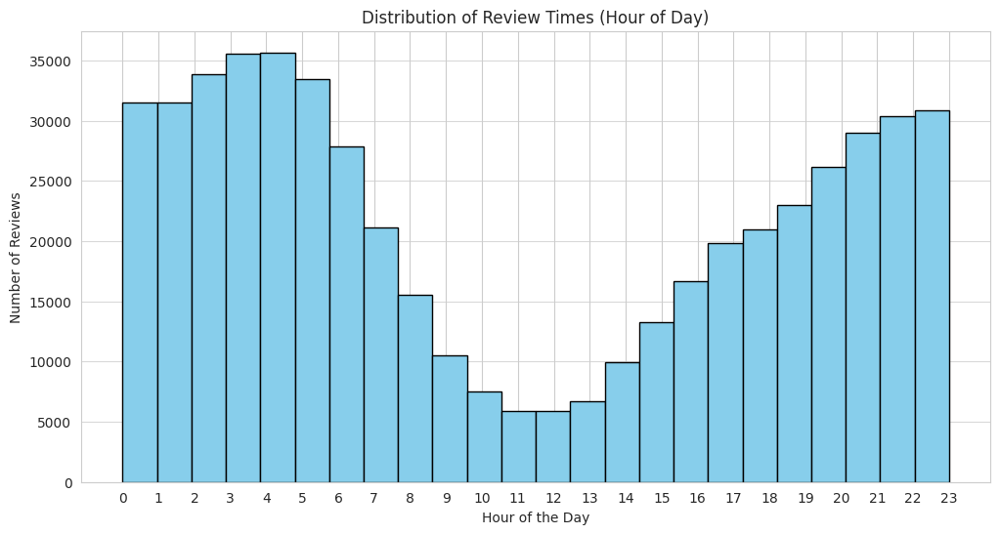

In [77]:
# Select the review_time column and convert to pandas DataFrame
# Drop null values before converting to pandas for plotting
review_hours_pd = review_sdf.select("review_time").dropna().toPandas()

# Plot a histogram of the review_time (which represents the hour)
plt.figure(figsize=(12, 6))
plt.hist(review_hours_pd['review_time'],
         bins=24,
         color='skyblue', edgecolor='black')
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Reviews")
plt.title("Distribution of Review Times (Hour of Day)")
plt.xticks(range(0, 24))
plt.grid(axis='y', alpha=0.75)
plt.show()

Based on the histogram of review times, it can be observed that the reviews submission drops from the morning hours towards noon. The number of reviews appears to peak during the midnight hours.

##### -year

In [78]:
from pyspark.sql.functions import year, col
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Create a 'review_year' column from 'review_datetime'
review_sdf = review_sdf.withColumn("review_year", year(col("review_datetime")))

# 2. Count the number of reviews per year and convert to pandas for plotting
review_counts_by_year = review_sdf.groupBy("review_year").count().orderBy("review_year").toPandas()

# Drop rows where review_year is null
review_counts_by_year.dropna(subset=['review_year'], inplace=True)

# Ensure 'review_year' is integer type for plotting
review_counts_by_year['review_year'] = review_counts_by_year['review_year'].astype(int)

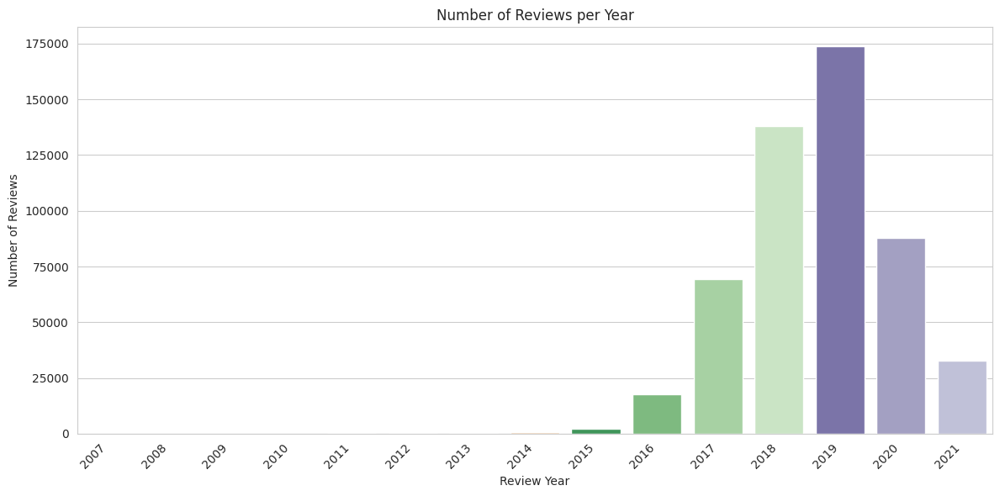

In [79]:
plt.figure(figsize=(12, 6))
sns.barplot(x="review_year", y="count",
            data=review_counts_by_year,
            palette="tab20c",
            hue="review_year", legend=False)
plt.xlabel("Review Year")
plt.ylabel("Number of Reviews")
plt.title("Number of Reviews per Year")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

before 2016 the frequency is lower, it could be due to the less widespread adoption of smartphones and mobile internet compared to later years.

Let's focus on during that period:

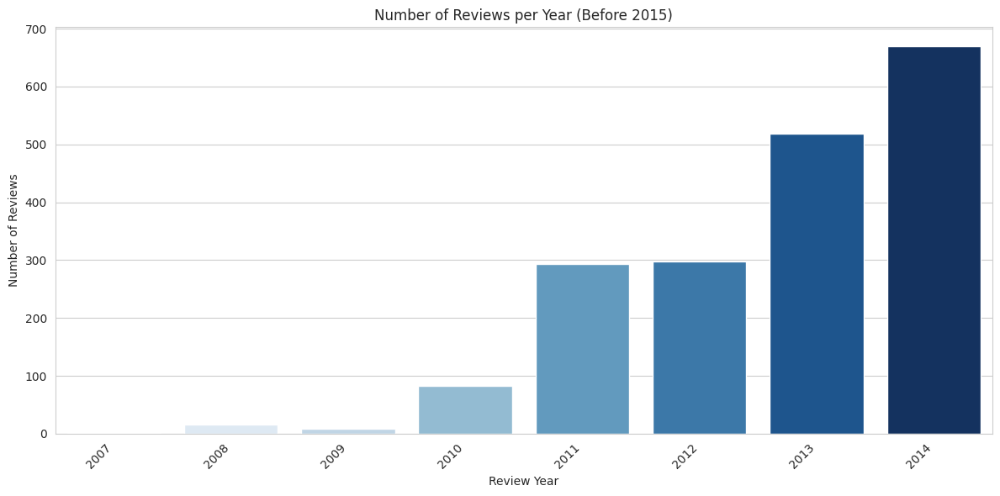

In [80]:
# Filter the DataFrame for years less than 2015
review_counts_before_2015 = review_counts_by_year[review_counts_by_year['review_year'] < 2015]

# Plot a histogram (bar plot) for years before 2015
plt.figure(figsize=(12, 6))
sns.barplot(x="review_year", y="count",
            data=review_counts_before_2015,
            palette="Blues",
            hue="review_year",
            legend=False)
plt.xlabel("Review Year")
plt.ylabel("Number of Reviews")
plt.title("Number of Reviews per Year (Before 2015)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

##### -month

In [81]:
from pyspark.sql.functions import month, date_format, col
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql import Row

# Create a 'review_month' column with the month name from 'review_datetime'
review_sdf = review_sdf.withColumn("review_month", date_format(col("review_datetime"), "MMMM")) # MMMM for full month name
review_sdf = review_sdf.withColumn("review_month_num", month(col("review_datetime"))) # Get month number for ordering

# Count the number of reviews per month
review_counts_by_month = review_sdf.groupBy("review_month", "review_month_num").count()

# Order by month number and convert to pandas for plotting
review_counts_pd = review_counts_by_month.orderBy("review_month_num").toPandas()

# Drop rows where review_month is null
review_counts_pd.dropna(subset=['review_month'], inplace=True)

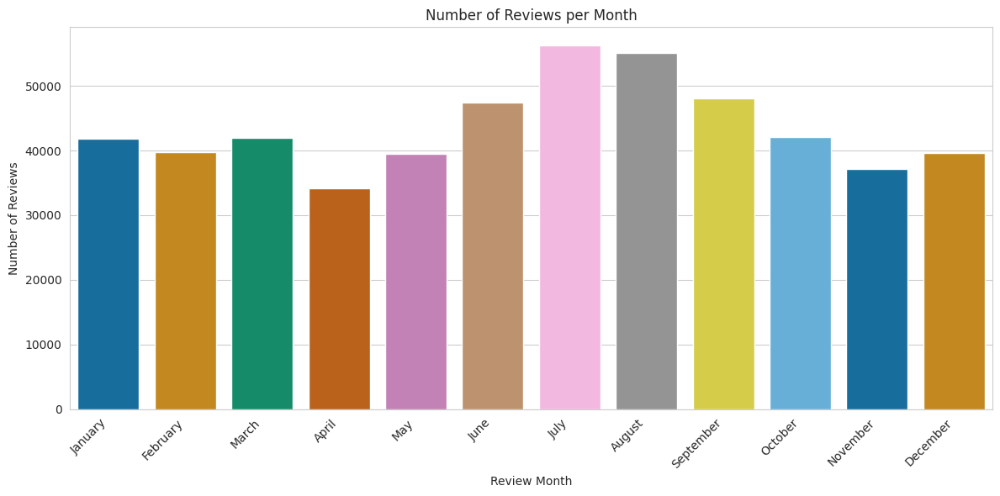

In [82]:
# Plot a bar plot of review months
plt.figure(figsize=(12, 6))
sns.barplot(x="review_month", y="count",
            data=review_counts_pd,
            palette="colorblind", hue="review_month", legend=False)
plt.xlabel("Review Month")
plt.ylabel("Number of Reviews")
plt.title("Number of Reviews per Month")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

## Q1.6 Build recommendation for business
(by using reviews, ratings, and its categories)

In [ ]:
# best month to travel [jun-sept]
# find the best locations for traveling [resturants, garden, iconic places for them to travel, stay and eat]

### Q1.6.1 Write down the strategy to build Recommendation
create own strategy or leverage KNN on collaborative filtering.
* Write about the logic



```
[customers want to travel to alaska, we want to pick up some hotels,
 resturants, garden, iconic places for them to travel, stay and eat]
```



Select three categories [hotel, tourist attraction, restaurant]

- calculate `calculated_avg_rating` from `review_sdf`, by making use of gmap_id; count the unique values for gmap_id in review_sdf and rating for that gmap_id, Then create the column `calculated_avg_rating` in meta_review

### Q1.6.2 Implement the strategy
add sufficient comments where required

## Q1.7 Analysis on `Rating`s for each submission review

### Selection of most frequent business categories

Count the most frequent words in the `category` column of the `meta_review` DataFrame.

* Parse category strings

Define a function or use Spark functions to parse the string representation of the list in the 'category' column and extract the individual category names as a list of strings.


In [83]:
from pyspark.sql.functions import col, split, regexp_replace

# Remove square brackets and single quotes from the 'category' column
cleaned_category_sdf = meta_review_sdf.withColumn(
    "cleaned_category",
    regexp_replace(col("category"), "\\[|\\]|'", "")
)

# Split the cleaned string by the comma and space delimiter into an array of strings
meta_review_sdf = cleaned_category_sdf.withColumn(
    "parsed_category",
    split(col("cleaned_category"), ", ")
).drop("cleaned_category") # Drop the intermediate cleaned_category column


# Show the first few rows with original and parsed categories
meta_review_sdf.select("category", "parsed_category").show(5, truncate=False)

+-----------------------------------+-------------------------------+
|category                           |parsed_category                |
+-----------------------------------+-------------------------------+
|['Cable company', 'Store']         |[Cable company, Store]         |
|['Pasta shop']                     |[Pasta shop]                   |
|['Acura dealer', 'Used car dealer']|[Acura dealer, Used car dealer]|
|['Performing arts theater']        |[Performing arts theater]      |
|['Caterer', 'Bakery', 'Deli']      |[Caterer, Bakery, Deli]        |
+-----------------------------------+-------------------------------+
only showing top 5 rows



* Explode the list

Use Spark's `explode` function to create new rows for each category name within the lists in the `parsed_category` column.


In [84]:
from pyspark.sql.functions import explode

# Apply explode to the parsed_category column
exploded_categories_sdf = meta_review_sdf.select(explode(col("parsed_category")).alias("category_name"))

# Show the first few rows
print("DataFrame with exploded category names:")
exploded_categories_sdf.show(5, truncate=False)

DataFrame with exploded category names:
+---------------+
|category_name  |
+---------------+
|Cable company  |
|Store          |
|Pasta shop     |
|Acura dealer   |
|Used car dealer|
+---------------+
only showing top 5 rows



* Clean and normalize category names

Clean up the extracted category names (e.g., remove extra spaces, convert to lowercase, handle punctuation if necessary) in the `exploded_categories_sdf` DataFrame.


In [85]:
from pyspark.sql.functions import lower, trim

# Apply trim and lower to the category_name column
exploded_categories_sdf = exploded_categories_sdf.withColumn(
    "category_name",
    lower(trim(col("category_name")))
)

# Show the first 10 rows to inspect the cleaned category names
print("DataFrame with cleaned category names:")
exploded_categories_sdf.show(10, truncate=False)

DataFrame with cleaned category names:
+-----------------------+
|category_name          |
+-----------------------+
|cable company          |
|store                  |
|pasta shop             |
|acura dealer           |
|used car dealer        |
|performing arts theater|
|caterer                |
|bakery                 |
|deli                   |
|art gallery            |
+-----------------------+
only showing top 10 rows



* Count category frequencies

Group the `exploded_categories_sdf` DataFrame by the cleaned category names and count the occurrences of each category.


In [86]:
from pyspark.sql.functions import count

# Group by category_name and count occurrences
category_counts = exploded_categories_sdf.groupBy("category_name").agg(count("*").alias("count"))

# Show the top 20 most frequent categories
print("Top 20 most frequent categories:")
category_counts.orderBy(col("count").desc()).show(20, truncate=False)

Top 20 most frequent categories:
+--------------------+-----+
|category_name       |count|
+--------------------+-----+
|restaurant          |670  |
|tourist attraction  |511  |
|coffee shop         |353  |
|gas station         |248  |
|auto repair shop    |232  |
|park                |226  |
|cafe                |225  |
|fast food restaurant|217  |
|gift shop           |207  |
|sandwich shop       |204  |
|american restaurant |204  |
|bar                 |196  |
|hotel               |189  |
|grocery store       |183  |
|pizza restaurant    |180  |
|takeout restaurant  |180  |
|lake                |169  |
|river               |162  |
|campground          |159  |
|lodge               |151  |
+--------------------+-----+
only showing top 20 rows



In [87]:
!pip install wordcloud matplotlib

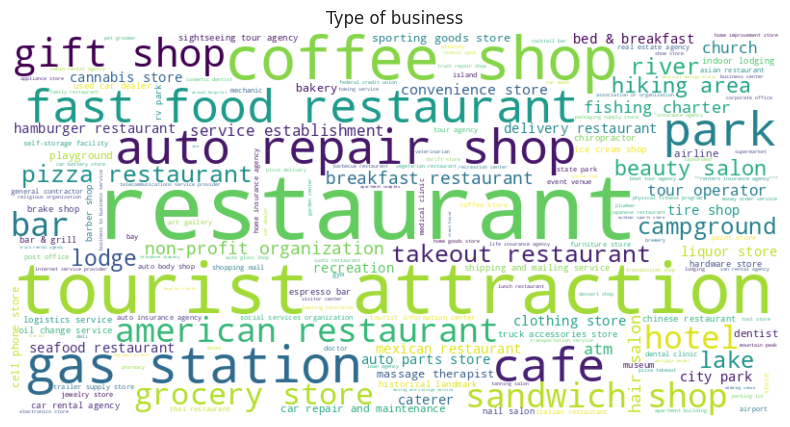

In [88]:
from wordcloud import WordCloud

# Convert the category_counts Spark DataFrame to a pandas DataFrame
category_counts_pd = category_counts.toPandas()

# Create a dictionary of word frequencies from the pandas DataFrame
word_freq = dict(zip(category_counts_pd['category_name'], category_counts_pd['count']))

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.title("Type of business")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Q1.7.1 Relationship of `rating` and `business categories`

#### Business's Name and their total reviews

In [89]:
print('Number of review for businesses (counted by default):')
meta_review_sdf.select('name','num_of_reviews').orderBy(col("num_of_reviews").desc()).show(10, truncate=False)

print('\nNumber of review for businesses (counted through gmap_id):')
joined_sdf.select('name','review_count').orderBy(col("review_count").desc()).show()

Number of review for businesses (counted by default):
+----------------------------------------------------+---------------------------------------------------+
|name                                                |num_of_reviews                                     |
+----------------------------------------------------+---------------------------------------------------+
|Antler Academy                                      |['Tourist attraction']                             |
|Mint Hut                                            |['Camp']                                           |
|Allergy, Asthma and Immunology Center of Alaska, LLC|['Allergist', 'Nutritionist', 'Speech pathologist']|
|Palmer Alehouse                                     |995                                                |
|Big Daddy's BBQ & Banquet Hall                      |994                                                |
|Walmart Supercenter                                 |993                                 

#### histogram of business category's avg ratings

A function to plot histogram of different business categories's average rating

In [90]:
from pyspark.sql.functions import col, array_contains
import matplotlib.pyplot as plt
import seaborn as sns

def plot_rating_distribution_by_category(spark_df, category_name):
    """
    Filters a Spark DataFrame for a specific business category and plots a
    histogram of the average ratings for businesses in that category.

    Args:
        spark_df (DataFrame): The Spark DataFrame containing business data,
                              including 'parsed_category' and 'avg_rating'.
        category_name (str): The name of the business category to filter by.
                             Assumes category_name is already cleaned (lowercase, no extra spaces).
    """
    # Filter the DataFrame for businesses with the specified category
    filtered_sdf = spark_df.filter(
        array_contains(col("parsed_category"), category_name)
    )

    # Select the 'avg_rating' column and convert to pandas DataFrame
    # Need to cast to double and drop null/invalid values before converting to pandas
    ratings_pd = filtered_sdf.select(col("avg_rating").cast("double").alias("avg_rating")).dropna().toPandas()

    if ratings_pd.empty:
        print(f"No businesses found for the category: '{category_name}' or no valid ratings.")
        return

    # Plot a histogram of the average ratings
    plt.figure(figsize=(10, 6))
    sns.histplot(data=ratings_pd, x="avg_rating",
                 bins=20, kde=True,
                 color='skyblue', edgecolor='black')
    plt.xlabel("Average Rating")
    plt.ylabel("Number of Businesses")
    plt.title(f"Distribution of Average Ratings for '{category_name.title()}' Businesses")
    plt.grid(axis='y', alpha=0.75)
    plt.show()

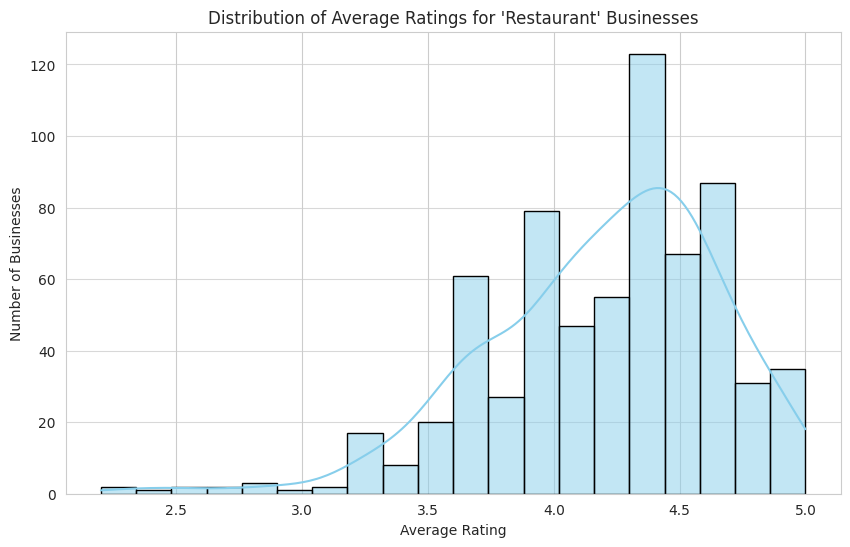

In [91]:
plot_rating_distribution_by_category(meta_review_sdf, "Restaurant")

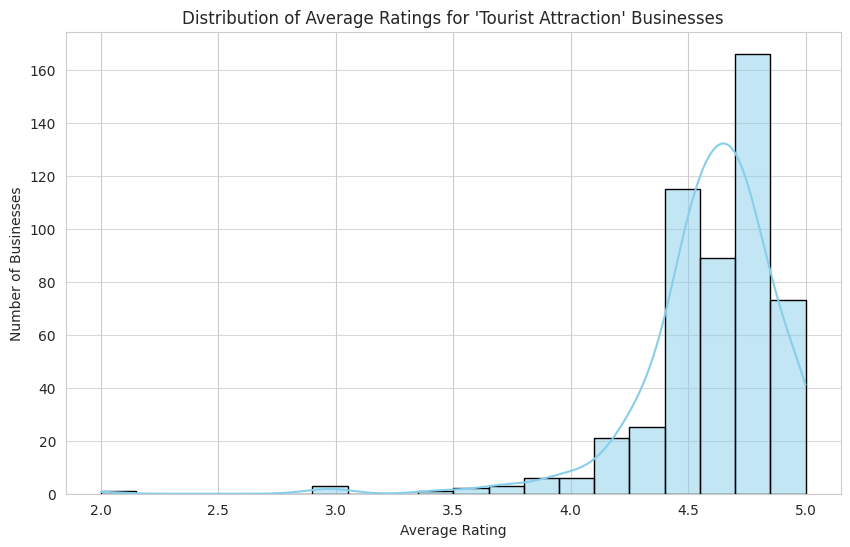

In [92]:
plot_rating_distribution_by_category(meta_review_sdf, "Tourist attraction")

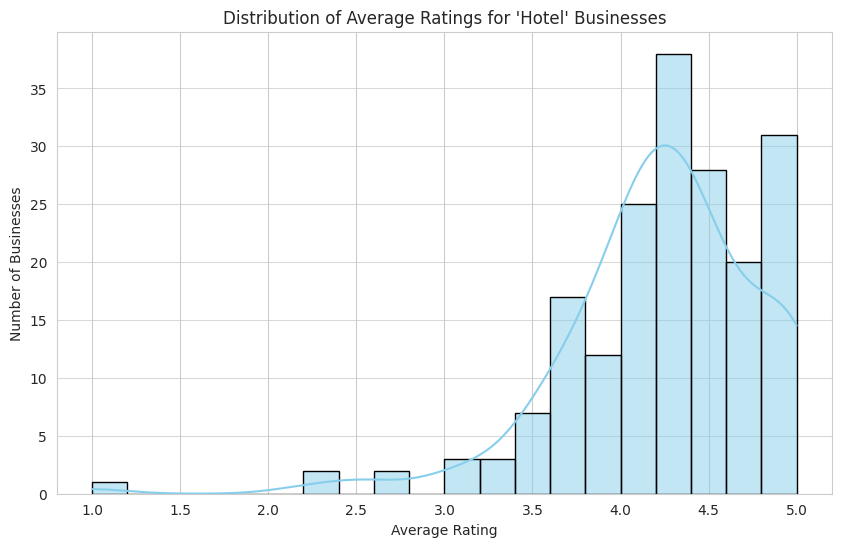

In [93]:
plot_rating_distribution_by_category(meta_review_sdf, "Hotel")

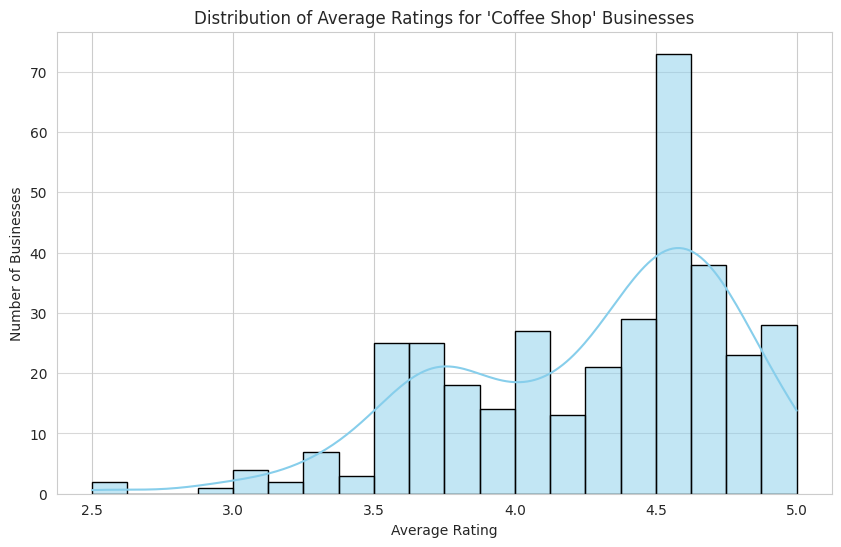

In [94]:
plot_rating_distribution_by_category(meta_review_sdf, "Coffee shop")

Based on the histograms of average ratings for 'Restaurant', 'Tourist Attraction', and 'Hotel' businesses:

*   **Restaurants:** The distribution for restaurants appears to be somewhat skewed towards higher ratings, with a peak around 4.0-4.5. There's a noticeable number of businesses with ratings in the 3.5-4.0 range as well, suggesting a wider spread of average ratings compared to tourist attractions. This might indicate more variability in customer experiences or a broader range of quality among restaurants in the dataset.

*   **Tourist Attractions:** The histogram for tourist attractions shows a strong concentration of businesses with very high average ratings, peaking sharply around 4.5-5.0. There are very few businesses with average ratings below 4.0. This suggests that the tourist attractions in this dataset are generally highly regarded by reviewers, possibly reflecting memorable or unique experiences that consistently lead to positive feedback.

*   **Hotels:** The distribution for hotels seems to be more spread out than tourist attractions but potentially less skewed than restaurants. There's a peak around 4.0-4.5, but also a significant number of hotels with ratings in the 3.5-4.0 range and some with ratings below 3.0. This wider spread might indicate a greater diversity in hotel quality, service levels, or customer expectations compared to the other categories.

Overall, 'Tourist Attractions' appear to have the highest average ratings and the least variability, while 'Restaurants' and 'Hotels' show a broader range of average ratings.

### Q1.7.2 Focus on lower ratings
[Select a threshold to considered as lower]
* Find the most common words
* Whats the reason behind lower rating?

In [95]:
from pyspark.sql.functions import col, array_contains, explode, count, lower, regexp_replace, split, array_except, array, lit, trim, udf
from pyspark.sql.types import ArrayType, StringType
from pyspark.ml.feature import StopWordsRemover
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re

def analyze_low_rated_reviews(meta_sdf, review_sdf, rating_threshold, business_category, print_flag=True, wordcloud_flag=True):
    """
    Analyzes reviews for businesses in a specific category with average rating below a given threshold.

    Args:
        meta_sdf (DataFrame): Spark DataFrame containing business metadata (with business category: as an array, which is the parsed_category).
        review_sdf (DataFrame): Spark DataFrame containing reviews (review_sdf).
        rating_threshold (float): The maximum average rating to consider for low-rated businesses.
        business_category (str): The category of businesses to analyze (should be cleaned/lowercase).
        print_flag (bool): If True, print the most common words and their counts.
        wordcloud_flag (bool): If True, generate and display a word cloud.
    """
    print(f"Analyzing reviews for '{business_category}' businesses with average rating below {rating_threshold}")

    # 1. Filter for low-rated businesses in the specified category
    # Need to re-clean the parsed_category column within the function scope if the input meta_sdf might not be the cleaned one
    category_filtered_sdf = meta_sdf.filter(array_contains(col("parsed_category"), business_category))

    # Filter for low average ratings, handling potential non-numeric values by coercing errors
    low_rated_businesses_sdf = category_filtered_sdf.filter(col("avg_rating").cast("double") < rating_threshold)

    if low_rated_businesses_sdf.count() == 0:
        print(f"No businesses found for the category '{business_category}' with average rating below {rating_threshold}.")
        return

    # 2. Extract gmap_ids of these low-rated businesses
    low_rated_business_gmap_ids = low_rated_businesses_sdf.select("gmap_id").collect()
    low_rated_gmap_ids_list = [row["gmap_id"] for row in low_rated_business_gmap_ids]

    if not low_rated_gmap_ids_list:
        print(f"No gmap_ids found for low-rated '{business_category}' businesses.")
        return


    # 3. Retrieve reviews for these gmap_ids
    low_rated_reviews_sdf = review_sdf.filter(col("gmap_id").isin(low_rated_gmap_ids_list))

    if low_rated_reviews_sdf.count() == 0:
        print(f"No reviews found for low-rated '{business_category}' businesses.")
        return

    # 4. Prepare text for analysis (cleaning and tokenization)
    # Remove punctuation
    low_rated_reviews_sdf = low_rated_reviews_sdf.withColumn(
        "cleaned_text",
        regexp_replace(col("text"), "[^a-zA-Z0-9\\s]", " ")
    )

    # Convert to lowercase and split into words
    low_rated_reviews_sdf = low_rated_reviews_sdf.withColumn(
        "words",
        split(lower(col("cleaned_text")), "\\s+")
    )

    # Remove stop words
    stop_words = StopWordsRemover.loadDefaultStopWords("english")
    stop_words_spark_array = array([lit(word) for word in stop_words])

    low_rated_reviews_sdf = low_rated_reviews_sdf.withColumn(
        "words_no_stopwords",
        array_except(col("words"), stop_words_spark_array)
    )

    # Remove empty strings and short words
    def filter_empty_and_short_python(word_list):
        if word_list is None:
            return None
        return [word for word in word_list if word is not None and len(word.strip()) > 1]

    filter_udf = udf(filter_empty_and_short_python, ArrayType(StringType()))

    low_rated_reviews_sdf = low_rated_reviews_sdf.withColumn(
        "cleaned_words",
        filter_udf(col("words_no_stopwords"))
    )

    # 5. Find most common words
    word_counts_sdf = low_rated_reviews_sdf.select(explode(col("cleaned_words")).alias("word")).groupBy("word").agg(count("*").alias("count"))
    top_words_sdf = word_counts_sdf.orderBy(col("count").desc())

    # 6. Display most common words
    if print_flag:
        print(f"\nTop 30 most common words in ratings below {rating_threshold} '{business_category}' reviews:")
        top_words_sdf.show(30, truncate=False)

    # 7. Generate word cloud
    if wordcloud_flag:
        top_words_pd = top_words_sdf.toPandas()
        word_freq = dict(zip(top_words_pd['word'], top_words_pd['count']))

        if word_freq:
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
            plt.figure(figsize=(10, 5))
            plt.title(f"Word Cloud of Most Common Words in '{business_category}' Reviews, [avg rating<{rating_threshold}]")
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.show()
        else:
            print("No words found to generate word cloud.")

    # 8. Finish task - Insights can be added in a separate markdown cell or based on the printed words/word cloud

#### Reviewing user comment for business type
The word count of "review" is the max because, all the `null` values were replaced by "No Review"

##### - hotel

Analyzing reviews for 'Hotel' businesses with average rating below 3.1


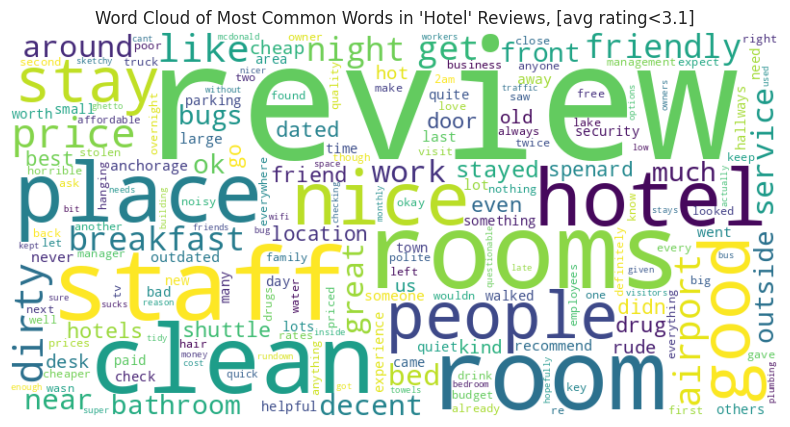

In [96]:
# Analyze reviews for 'hotel' businesses with average rating below 3.5
analyze_low_rated_reviews(meta_review_sdf, review_sdf,
                          rating_threshold= 3.1,
                          business_category= "Hotel",
                          print_flag=False, wordcloud_flag=True)

##### Tourist Attraction

Analyzing reviews for 'Tourist attraction' businesses with average rating below 3.9


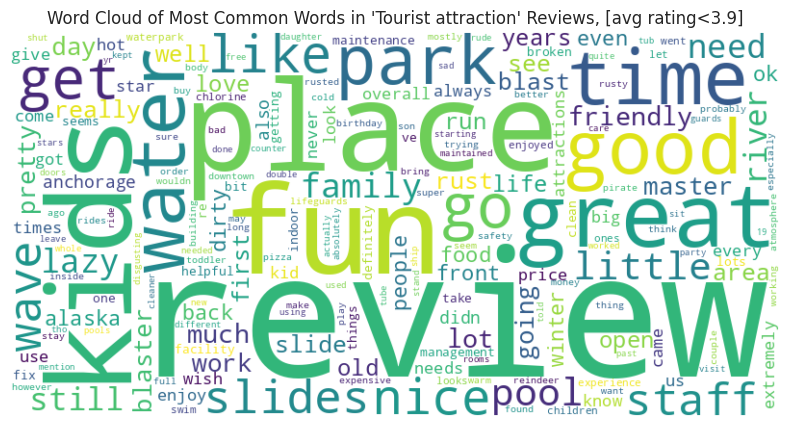

In [97]:
analyze_low_rated_reviews(meta_review_sdf, review_sdf,
                          rating_threshold= 3.9,
                          business_category= "Tourist attraction",
                          print_flag=False, wordcloud_flag=True)

##### - Restaurants

Analyzing reviews for 'Restaurant' businesses with average rating below 3.5


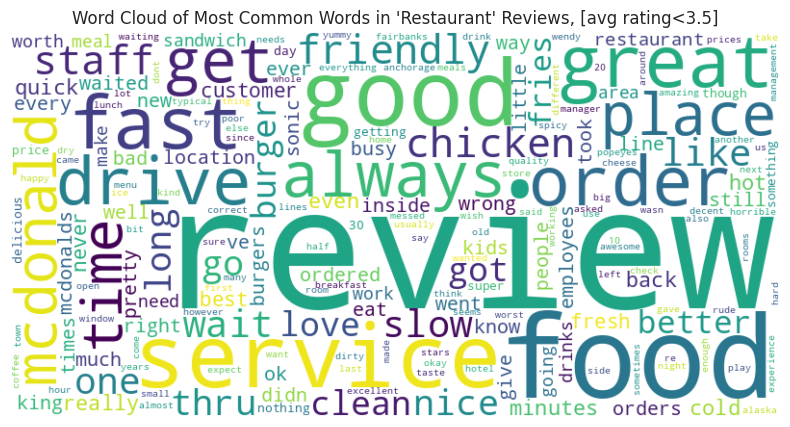

In [98]:
analyze_low_rated_reviews(meta_review_sdf, review_sdf,
                          rating_threshold= 3.5,
                          business_category= "Restaurant",
                          print_flag=False, wordcloud_flag=True)

#### search for keywords in user comment
the functions' usability is to find the searched keyword present in users' comment/`text`. Furthermore, the rows are filtered by user's given `rating` and businesses `avg_rating`

In [120]:
from pyspark.sql.functions import col, lower, concat_ws
from pyspark.sql import DataFrame

def filter_reviews_by_keywords(review_sdf: DataFrame, keywords: list):
    """
    Filters a review DataFrame for reviews containing any of the specified keywords.

    Args:
        review_sdf (DataFrame): The Spark DataFrame containing reviews.
        keywords (list): A list of keywords to search for (case-insensitive).

    Returns:
        DataFrame: A filtered Spark DataFrame containing reviews that include any of the keywords.
    """
    if not keywords:
        return review_sdf # Return original DataFrame if no keywords are provided

    # Build the filter condition by combining 'contains' conditions for each keyword
    filter_condition = lower(col("text")).contains(keywords[0])
    for keyword in keywords[1:]:
        filter_condition = filter_condition | lower(col("text")).contains(keyword)

    return review_sdf.filter(filter_condition)

def analyze_reviews_by_keywords(review_sdf: DataFrame, meta_sdf: DataFrame, keywords: list, user_rating_threshold: float = 3.5, bus_rating_threshold: float = 3.5):
    """
    Analyzes reviews containing specific keywords and displays review and business details.

    Args:
        review_sdf (DataFrame): The Spark DataFrame containing reviews.
        meta_sdf (DataFrame): The Spark DataFrame containing business metadata.
        keywords (list): A list of keywords to search for in the review text (case-insensitive).
        user_rating_threshold (float): The maximum rating to consider for filtering reviews. Defaults to 3.5.
        bus_rating_threshold (float): The maximum rating to consider for filtering businesses. Defaults to 3.5.
    """
    print(f"Analyzing user reviews containing any of the keywords: {keywords} that has rating <= {user_rating_threshold}.")

    # 1. Filter review_sdf for reviews containing any of the keywords (case-insensitive)
    reviews_with_keywords = filter_reviews_by_keywords(review_sdf, keywords)

    if reviews_with_keywords.count() == 0:
        print(f"No user reviews found containing any of the keywords: {keywords}")
        return

    # 2. Filter by rating < user_rating_threshold (casting rating to double for comparison)
    # Handle potential non-numeric ratings by coercing errors to null and dropping them
    reviews_with_keywords = reviews_with_keywords.filter(col("rating").cast("double") <= user_rating_threshold)


    if reviews_with_keywords.count() == 0:
        print(f"No user reviews found containing any of the keywords: {keywords} that has rating <= {user_rating_threshold}.")
        return


    # 3. Join reviews_with_keywords with meta_review_sdf on gmap_id
    # Select relevant columns from meta_review_sdf and rename 'name' to 'business_name' before the join
    meta_review_subset = meta_sdf.select(
        "gmap_id",
        col("name").alias("business_name"),
        "avg_rating",
        "category",
        "num_of_reviews",
        "address"
    )

    joined_reviews_businesses = reviews_with_keywords.join(
        meta_review_subset,
        on="gmap_id",
        how="inner" # Use inner join to get only reviews for businesses found in meta_review_sdf
    )

    # 4. Show the reviews containing the keywords along with business details
    print(f"\nReviews containing any of the keywords {keywords} with business details (avg_rating <= {bus_rating_threshold}):")
    joined_reviews_businesses.select(
        col("name").alias("user_name"), # Reviewer's name
        col("rating").alias("user_rating"), # Review rating
        "business_name", # Business name from meta_review_sdf
        col("avg_rating").alias("bus_avg_rating"), # Business average rating from meta_review_sdf
        "text", # Review text
        "gmap_id" # Include gmap_id for reference
    ).filter(col("avg_rating").cast("double") <= bus_rating_threshold).show(truncate=False)

    #Show business details only (can be removed if not needed)
    print(f"\nBusinesses with reviews containing any of the keywords {keywords}\n (user rating <= {user_rating_threshold}) & (business avg_rating)<= {bus_rating_threshold}:")
    joined_reviews_businesses.select("business_name", "avg_rating", "num_of_reviews", "address", "category").distinct().show(truncate=False)

In [121]:
keywords_to_analyze = ["dirty", "bugs"]
analyze_reviews_by_keywords(review_sdf, meta_review_sdf,
                            keywords_to_analyze,
                            user_rating_threshold=3)


Analyzing user reviews containing any of the keywords: ['dirty', 'bugs'] that has rating <= 3.

Reviews containing any of the keywords ['dirty', 'bugs'] with business details (avg_rating <= 3.5):
+-----------------------------+-----------+--------------------------------------------------+--------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

the businesses below might be the ***potential places to avoid***, have to validate by `avg_ratings`

In [122]:
keywords_to_analyze = ["rude", "wait time"]
analyze_reviews_by_keywords(review_sdf, meta_review_sdf,
                            keywords_to_analyze,
                            user_rating_threshold=3.5,
                            bus_rating_threshold=3)

Analyzing user reviews containing any of the keywords: ['rude', 'wait time'] that has rating <= 3.5.

Reviews containing any of the keywords ['rude', 'wait time'] with business details (avg_rating <= 3):
+--------------------+-----------+--------------------------------------------------+--------------+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-------------------------------------+
|user_name           |user_rating|business_name

Suitable for kids?

In [124]:
keywords_to_analyze = ["kids"]
analyze_reviews_by_keywords(review_sdf, meta_review_sdf,
                            keywords_to_analyze,
                            user_rating_threshold=2.9)

Analyzing user reviews containing any of the keywords: ['kids'] that has rating <= 2.9.

Reviews containing any of the keywords ['kids'] with business details (avg_rating <= 3.5):
+---------------------+-----------+--------------------------------------------------+--------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

*Insights on Low-Rated Businesses based on Keyword Analysis*

Based on the analysis of reviews containing specific keywords ("dirty", "bugs", "rude", "wait time", "kids") and having lower ratings (below a certain threshold), here are some potential insights into factors contributing to low business ratings:

*   **Cleanliness Issues:** The presence of keywords like "dirty" and "bugs" in lower-rated reviews strongly suggests that cleanliness is a significant factor in negative customer experiences. Businesses with reviews mentioning these issues are likely to receive lower ratings.

*   **Poor Service and Long Wait Times:** Keywords such as "rude" and "wait time" appearing in lower-rated reviews indicate that the quality of service and the efficiency of service (specifically, long waiting periods) are critical aspects influencing customer satisfaction and ratings.

*   **Issues Related to Children/Family Experience:** The keyword "kids" in some lower-rated reviews, particularly in the context of places like waterparks or restaurants, suggests that experiences related to accommodating children, safety for kids, or staff interaction with families can lead to negative feedback and lower ratings.

*   **Mismatch between Business Type and Keyword Issues:** It's notable that some businesses with relatively higher average ratings (e.g., above 4.0) also received individual low ratings due to these specific issues. This highlights that even generally well-regarded businesses can have specific areas (like cleanliness or service on a particular day) that lead to negative experiences for some customers.

*   **Specific Mentions of Problems:** The review text often provides specific details about the negative experience (e.g., "bedbugs", "soggy bread and the cheese choice was bad", "staff is a bunch of kids, very rude"). These specific mentions are valuable for businesses to identify and address root causes of dissatisfaction.

*   **Potential for Improvement:** Identifying these recurring keywords and the context in which they appear in low-rated reviews can help businesses pinpoint areas for improvement, such as staff training, cleanliness protocols, or managing customer flow to reduce wait times.

These insights are based on reviews containing specific keywords and a rating threshold. A more comprehensive analysis would involve analyzing all low-rated reviews regardless of keyword presence and potentially performing a detailed sentiment analysis.

## Q1.8 Reviewer level with all the reviewed business history (submission of the review)

### Q1.8.1 Create a `user_business_list`
* check reviewer level for reviewed business
* sort the review based on review time (`new_time` column)
* save the business name, for each reviewer into the `user_business_list`
* for the list: print the `number of elements` / `number of business name` for each reviewers **[before removing]**

### Q1.8.2 Repeated business names for the same user/reviewer?
* remove those duplicated business names under same user (take unique business name)
* print the `number of business name` for each reviewers **[after removing]**

### Q1.8.3 user similarities in the past reviewed business
* Write down the strategy for implementation with sufficient explanation
* Check on the `user_business_list` and find the user similarities according to their past reviewed business.

Hint: you might consider to use `encoding` for each of the business names and then calculate the difference of the users.

# Part 2
---

## Q2.1 Seasonality Pattern

## Q2.2 ARIMA Model

## Q2.3 Analyze Annual Report of Indigenous Strategy
link to the pdf

### Data Extraction

### Data Analysis

### Insights

---
<center>
End of Assignment
</center>